## Classification Model with Linear Model

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
from fastai.structured import *
from fastai.column_data import *
np.set_printoptions(threshold=50, edgeitems=20)

In [3]:
import parse_inputs

from pathlib import Path

import numpy as np
import pandas as pd
from pandas_plink import read_plink

from sklearn import linear_model
from sklearn.svm import SVR
from sklearn import metrics

from ggplot import *
PATH=Path('ddat/crowdAI/')
TMP_PATH = PATH/'tmp'
TMP_PATH.mkdir(exist_ok=True)

/home/ahmadA/anaconda3/envs/fastai/lib/python3.6/site-packages/ggplot/utils.py:81: FutureWarning: pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp
  pd.tslib.Timestamp,
/home/ahmadA/anaconda3/envs/fastai/lib/python3.6/site-packages/ggplot/stats/smoothers.py:4: FutureWarning: The pandas.lib module is deprecated and will be removed in a future version. These are private functions and can be accessed from pandas._libs.lib instead
  from pandas.lib import Timestamp
/home/ahmadA/anaconda3/envs/fastai/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [4]:
from sklearn.decomposition import PCA

In [5]:
from sklearn import linear_model
import crowdai

In [6]:
import random

In [7]:
from snp2h import *

# Loading Genotype and Phenotype

In [8]:
tz_plink = read_plink('ddat/crowdAI/all2964/bin_final_strand')
tz_maf = pd.read_csv(PATH/'TZ14_one.frq',delim_whitespace=True)
all_meta = pd.read_csv(TMP_PATH/'tz_and_os_meta.csv',index_col=0)
all_meta.head()

Mapping files: 100%|██████████| 3/3 [00:02<00:00,  1.30s/it]


,ID,height,ChipID,nationality,gender,biclass,triclass,residual
9992564090_R01C01,TL2257,177.0,9992564090_R01C01,0,1,1,1,8.606139
9992564090_R05C01,TL0067,155.0,9992564090_R05C01,0,2,0,0,-1.518641
9992564090_R07C01,TL0139,143.5,9992564090_R07C01,0,2,0,-1,-13.018641
9992564090_R08C01,TL0279,161.9,9992564090_R08C01,0,2,1,1,5.381359
9992564137_R01C01,TL1090,155.2,9992564137_R01C01,0,2,0,0,-1.318641


In [89]:
pcs = pd.read_csv(PATH/'all2964/tz_plink_ld_r2_0.2.eigenvec',delim_whitespace=True,header=None,usecols=range(1,6),index_col=0)

In [90]:
pcs.columns = ['pc1','pc2','pc3','pc4']

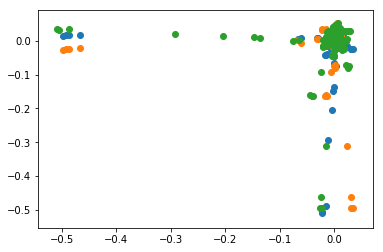

In [99]:
plt.scatter(pcs.pc1,pcs.pc2)
plt.scatter(pcs.pc1,pcs.pc3)
plt.scatter(pcs.pc2,pcs.pc3)

In [112]:
i = -0.1
sum(pcs.pc1< i),sum(pcs.pc2<i),sum(pcs.pc3<i),sum(pcs.pc4<i),sum((pcs<i).sum(1)==0)

(4, 7, 7, 4, 2946)

In [81]:
import numpy as np

def removeOutliers(x, outlierConstant=1.5):
    a = np.array(x)
    upper_quartile = np.percentile(a, 75)
    lower_quartile = np.percentile(a, 25)
    IQR = (upper_quartile - lower_quartile) * outlierConstant
    quartileSet = (lower_quartile - IQR, upper_quartile + IQR)
    resultList = []
    for y in a.tolist():
        if y >= quartileSet[0] and y <= quartileSet[1]:
            resultList.append(y)
    return resultList

In [84]:
def mad_based_outlier(points, thresh=3.5):
    if len(points.shape) == 1:
        points = points[:,None]
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > thresh

def percentile_based_outlier(data, threshold=95):
    diff = (100 - threshold) / 2.0
    minval, maxval = np.percentile(data, [diff, 100 - diff])
    return (data < minval) | (data > maxval)

In [88]:
sum(percentile_based_outlier(np.array(pcs.pc3)))

150

In [83]:
len(removeOutliers(np.array(pcs.pc1)))

2914

(array([   3.,    0.,    0.,    1.,    3.,    0.,    1.,    0., 2887.,   69.]),
 array([-0.47656, -0.42243, -0.3683 , -0.31418, -0.26005, -0.20593, -0.1518 , -0.09768, -0.04355,  0.01057,
         0.0647 ]),
 <a list of 10 Patch objects>)

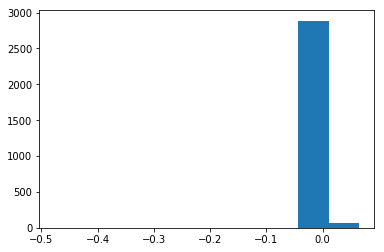

In [80]:
plt.hist(pcs.pc4)

In [69]:
pcs.head()

,pc1,pc2,pc3,pc4
1,,,,
9992564090_R01C01,-0.002153,0.005162,-0.009551,0.001801
9992564090_R02C01,-0.000760,0.001298,0.000205,0.006244
9992564090_R04C01,0.001983,0.005145,0.000541,0.005650
9992564090_R05C01,-0.000875,0.003965,0.000334,-0.003586
9992564090_R06C01,0.002148,-0.000913,0.003487,-0.001595


In [21]:
import plotly

In [25]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import numpy as np
plotly.offline.init_notebook_mode(connected=True)

x, y, z,c = pcs.iloc[:,2],pcs.iloc[:,3],pcs.iloc[:,4],(pcs.iloc[:,0]!='HAN').astype(int)

trace1 = go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=12,
        color=c,                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
plot(fig, filename='3d-scatter-colorscale')

/home/ahmadA/anaconda3/envs/fastai/lib/python3.6/site-packages/plotly/offline/offline.py:459: UserWarning:

Your filename `3d-scatter-colorscale` didn't end with .html. Adding .html to the end of your file.



'file:///home/ahmadA/dereck/proj/predict_height/3d-scatter-colorscale.html'

# Filter genotype  

In [35]:
tz_maf_filter = tz_maf.apply(select_snp, axis=1)
tz_maf_new=tz_maf.loc[tz_maf_filter==1,]
tz_sample_index = [i for i,x in enumerate(tz_plink[1].iid) if x in list(all_meta.index)]
tz_plink=plink_slice(tz_plink,list(tz_maf_new.index),tz_sample_index)

# Get GWAS 

In [36]:
snps = {'tz_a':pd.read_csv(TMP_PATH/'SNPs_GWAS_Pincrease_Residual_of_Gender.csv',index_col=0),
       'tz_f':pd.read_csv(TMP_PATH/'SNPs_GWAS_TZ_Female.csv',index_col=0),
       'tz_m':pd.read_csv(TMP_PATH/'SNPs_GWAS_TZ_Male.csv',index_col=0),
       'os_a':pd.read_csv(TMP_PATH/'SNPs_GWAS_Pincrease_Residual_of_Gender_OS.csv',index_col=0),
       'os_f':pd.read_csv(TMP_PATH/'SNPs_GWAS_OS_Female.csv',index_col=0),
       'os_m':pd.read_csv(TMP_PATH/'SNPs_GWAS_OS_Male.csv',index_col=0),
       'other':pd.read_csv(TMP_PATH/'snps_sorted_p_val_v2.csv',index_col=0)}

In [37]:
snp_pool = set(tz_plink[0].snp)
len(snp_pool)

684066

In [38]:
def topn_snp(s,p,t=500):
    n = 0
    snp = []
    for x in s.index:
        if x in p:
            n +=1
            snp.append(x)
            if n>=t:
                break
    return snp

In [39]:
snp_list=[{k:topn_snp(v,snp_pool,t=n) for k,v in snps.items()} for n in [50,100,200,300,500]]

# Linear model (gender and nationality)

In [40]:
def gn_residual(meta,test=None,t=True,col=['gender','nationality']):
    #Load training data
    x_train = meta[col]
    y_train = meta.height

    # Instantiate a linear model
    regr = linear_model.LinearRegression()
    regr.fit(x_train, y_train)
    if t:
        x_test = test[col]
        # Predict the heights for the test set
        heights = regr.predict(x_test)
        submit(heights)
    return regr

In [122]:
tz_meta=all_meta.loc[tz_plink[1].iid,]

In [123]:
tz_meta=tz_meta.join(pcs.loc[tz_meta.index,:])

In [125]:
regr = gn_residual(tz_meta,t=False,col=['gender','nationality','pc1','pc2','pc3','pc4'])

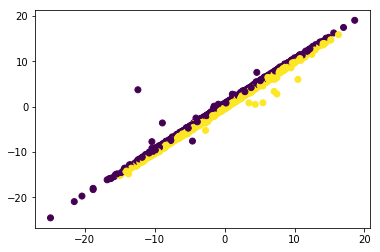

In [126]:
plt.scatter(tz_meta.residual,tz_meta.height-regr.predict(tz_meta[['gender','nationality','pc1','pc2','pc3','pc4']]),c=tz_meta.gender)

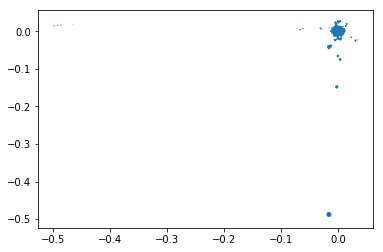

In [127]:
plt.scatter(tz_meta.pc1,tz_meta.pc2,s=(tz_meta.residual-(tz_meta.height-regr.predict(tz_meta[['gender','nationality','pc1','pc2','pc3','pc4']]))).abs())

50
(50, 7) (2747, 7) (2747, 50)
2747 2197
(2747, 26)
[(2197, 26), (550, 26), (1758, 26), (989, 26)]


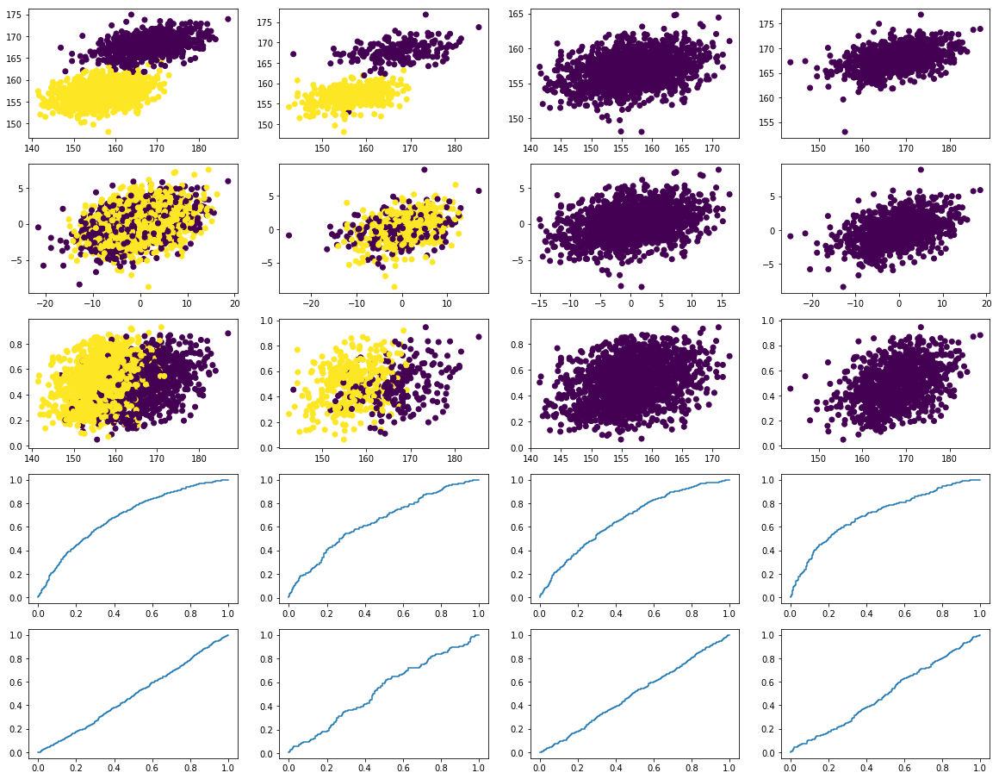

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.688923  0.483514
val     33.977128  0.437954  0.644843  0.533809
female  27.913720  0.004636  0.666160  0.493754
male    37.734385  0.005975  0.705637  0.493002
(141, 7) (2747, 7) (2747, 141)
2747 2197
(2747, 86)
[(2197, 86), (550, 86), (1758, 86), (989, 86)]


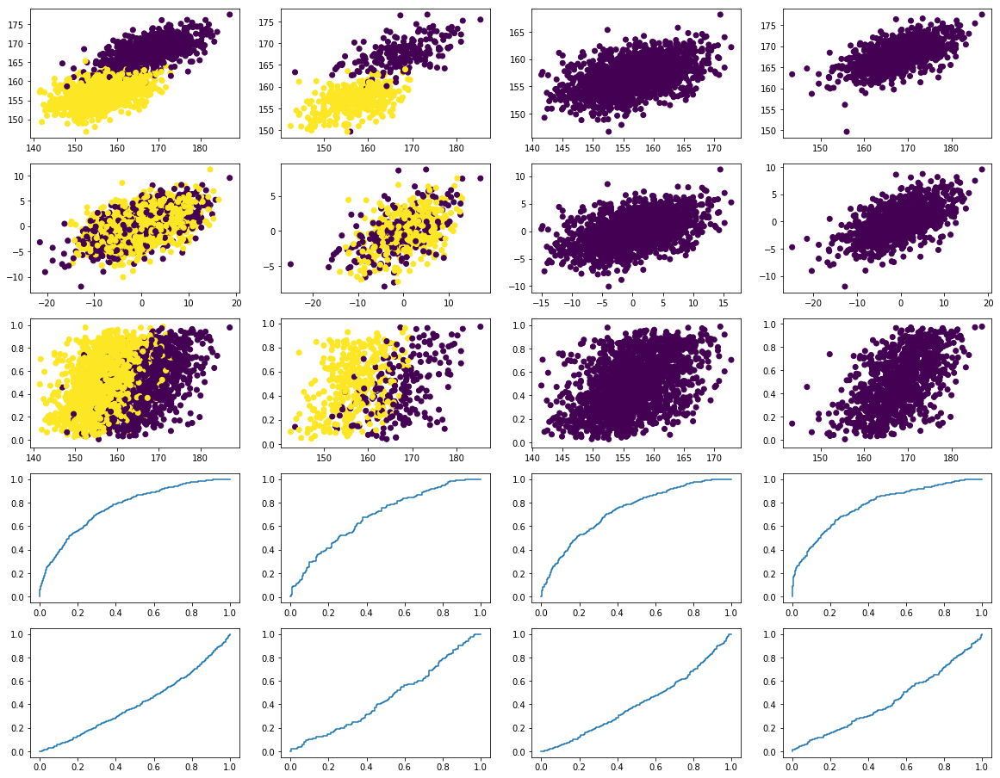

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.764935  0.407887
val     33.977128  0.437954  0.685602  0.457193
female  27.913720  0.004636  0.732731  0.411242
male    37.734385  0.005975  0.776201  0.430201
100
(100, 7) (2747, 7) (2747, 100)
2747 2197
(2747, 56)
[(2197, 56), (550, 56), (1758, 56), (989, 56)]


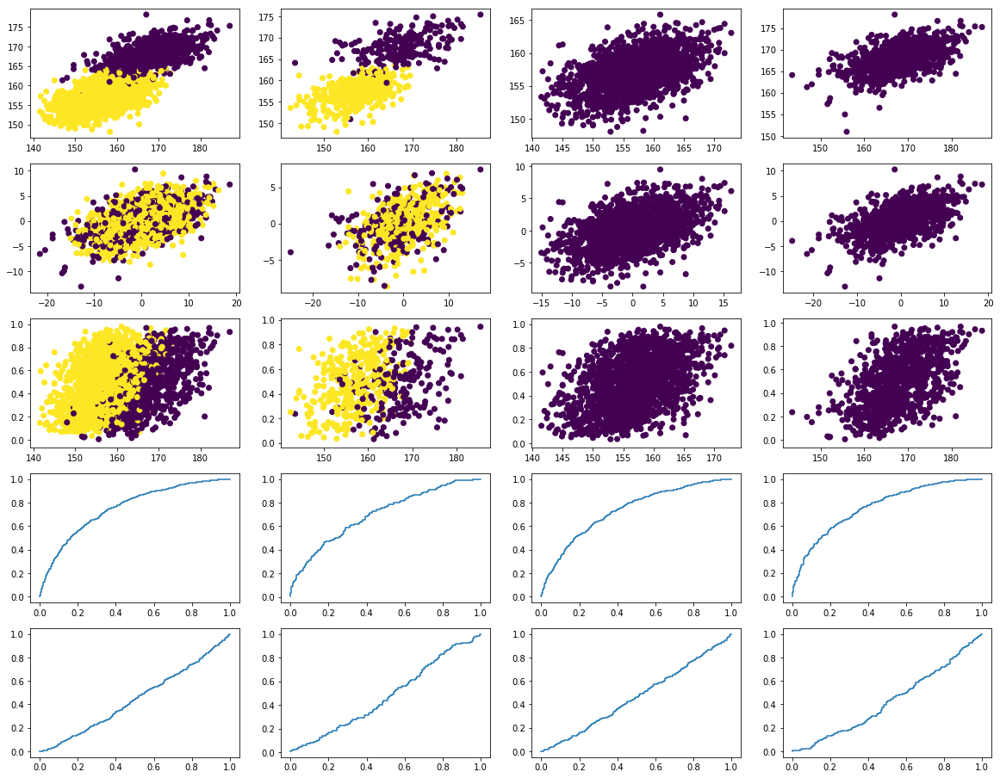

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.754883  0.445981
val     33.977128  0.437954  0.700419  0.473507
female  27.913720  0.004636  0.733327  0.466091
male    37.734385  0.005975  0.763054  0.426074
(270, 7) (2747, 7) (2747, 270)
2747 2197
(2747, 162)
[(2197, 162), (550, 162), (1758, 162), (989, 162)]


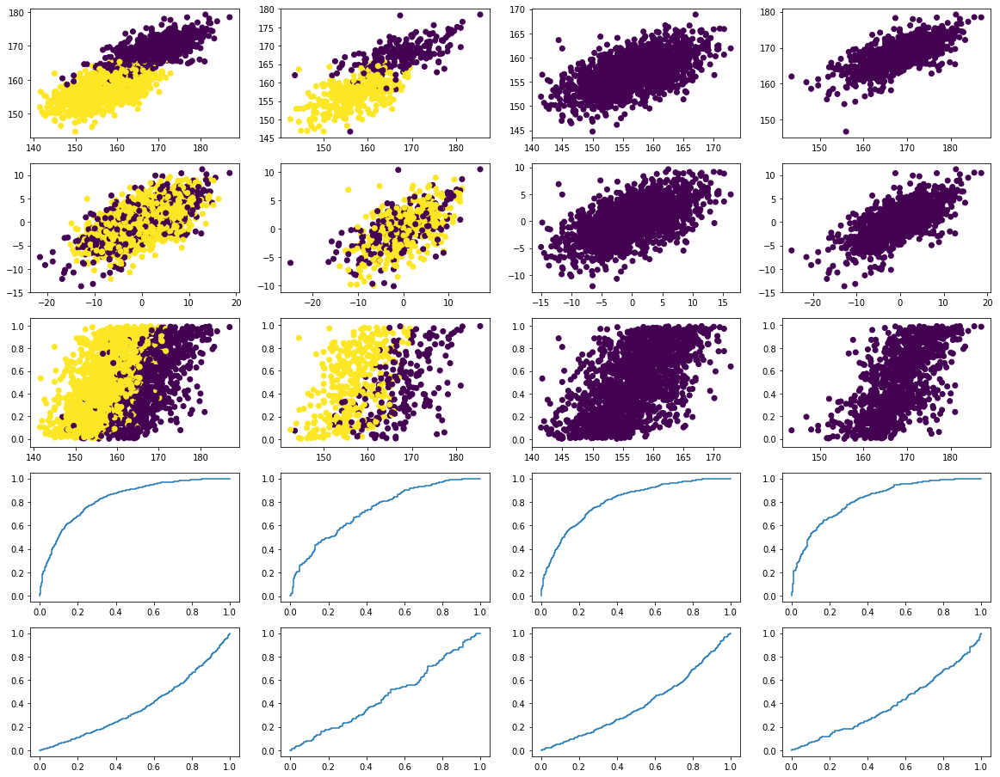

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.828789  0.374929
val     33.977128  0.437954  0.734366  0.465263
female  27.913720  0.004636  0.803938  0.394006
male    37.734385  0.005975  0.821272  0.391605
200
(200, 7) (2747, 7) (2747, 200)
2747 2197
(2747, 110)
[(2197, 110), (550, 110), (1758, 110), (989, 110)]


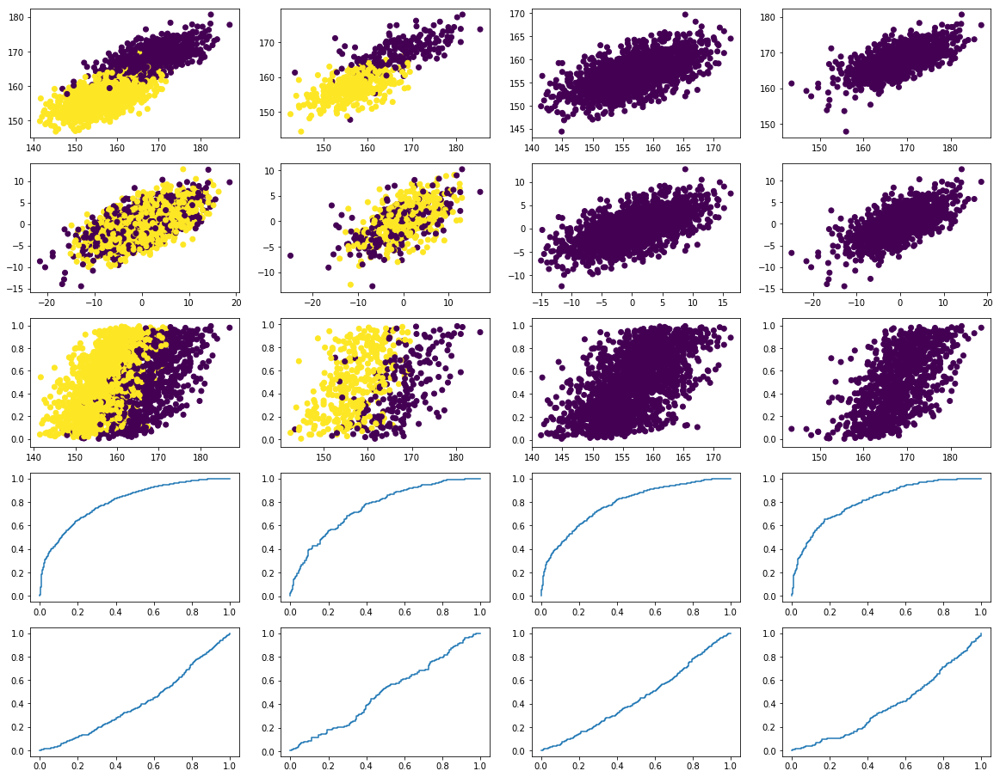

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.804324  0.405126
val     33.977128  0.437954  0.754395  0.492709
female  27.913720  0.004636  0.784712  0.445551
male    37.734385  0.005975  0.809433  0.384835
(542, 7) (2747, 7) (2747, 542)
2747 2197
(2747, 313)
[(2197, 313), (550, 313), (1758, 313), (989, 313)]


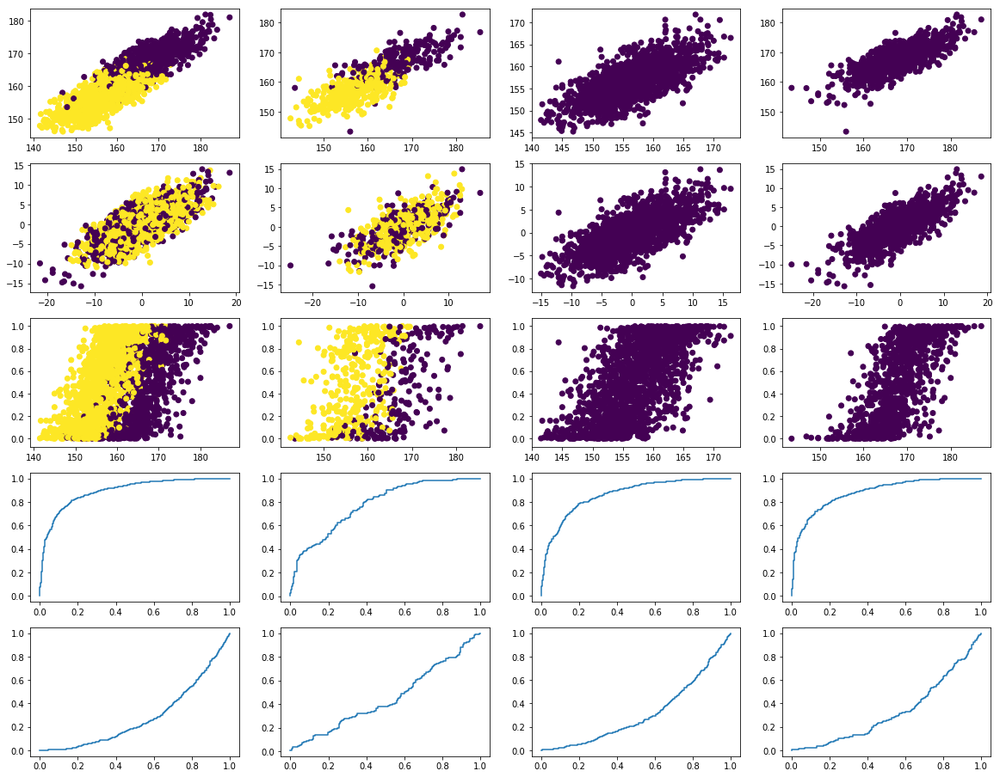

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.892712  0.284624
val     33.977128  0.437954  0.776833  0.449894
female  27.913720  0.004636  0.860822  0.315536
male    37.734385  0.005975  0.880333  0.327553
300
(300, 7) (2747, 7) (2747, 300)
2747 2197
(2747, 158)
[(2197, 158), (550, 158), (1758, 158), (989, 158)]


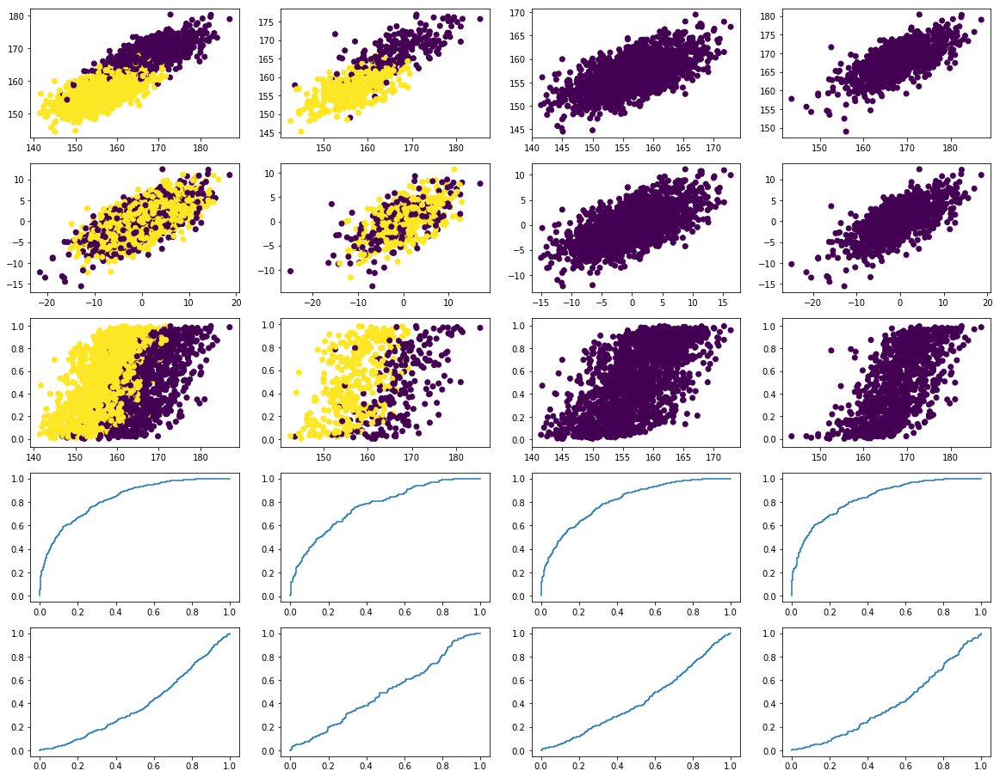

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.828847  0.390364
val     33.977128  0.437954  0.766262  0.499221
female  27.913720  0.004636  0.806523  0.424368
male    37.734385  0.005975  0.832383  0.393107
(808, 7) (2747, 7) (2747, 808)
2747 2197
(2747, 447)
[(2197, 447), (550, 447), (1758, 447), (989, 447)]


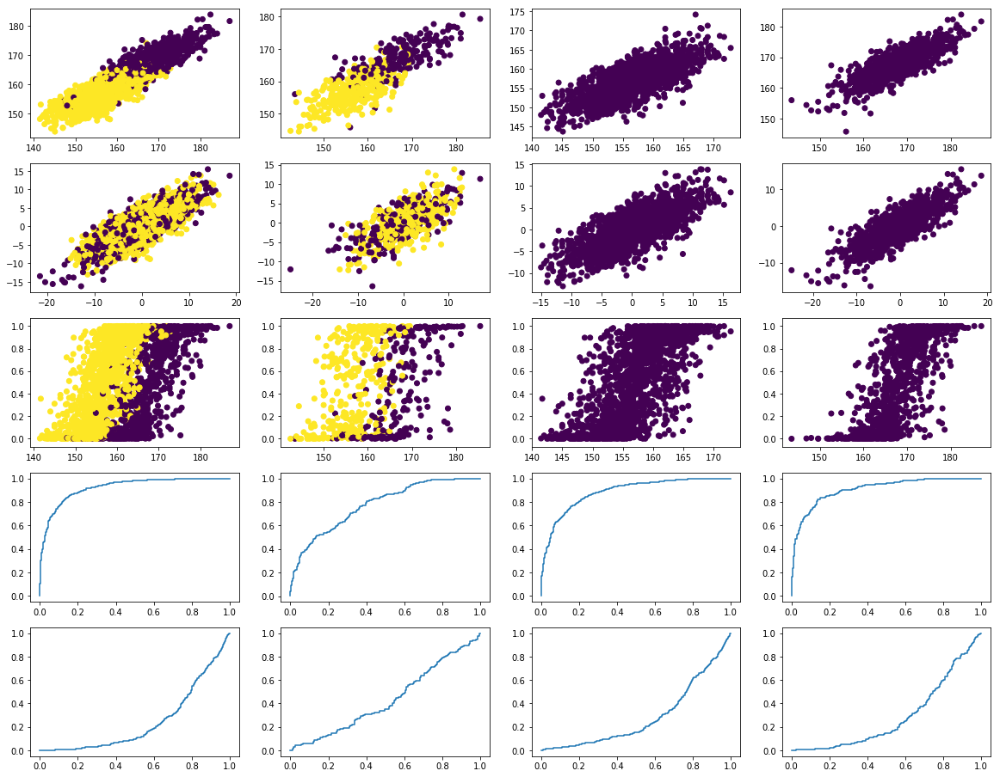

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.923388  0.245233
val     33.977128  0.437954  0.775867  0.433388
female  27.913720  0.004636  0.883760  0.285631
male    37.734385  0.005975  0.907782  0.288001
500
(500, 7) (2747, 7) (2747, 500)
2747 2197
(2747, 261)
[(2197, 261), (550, 261), (1758, 261), (989, 261)]


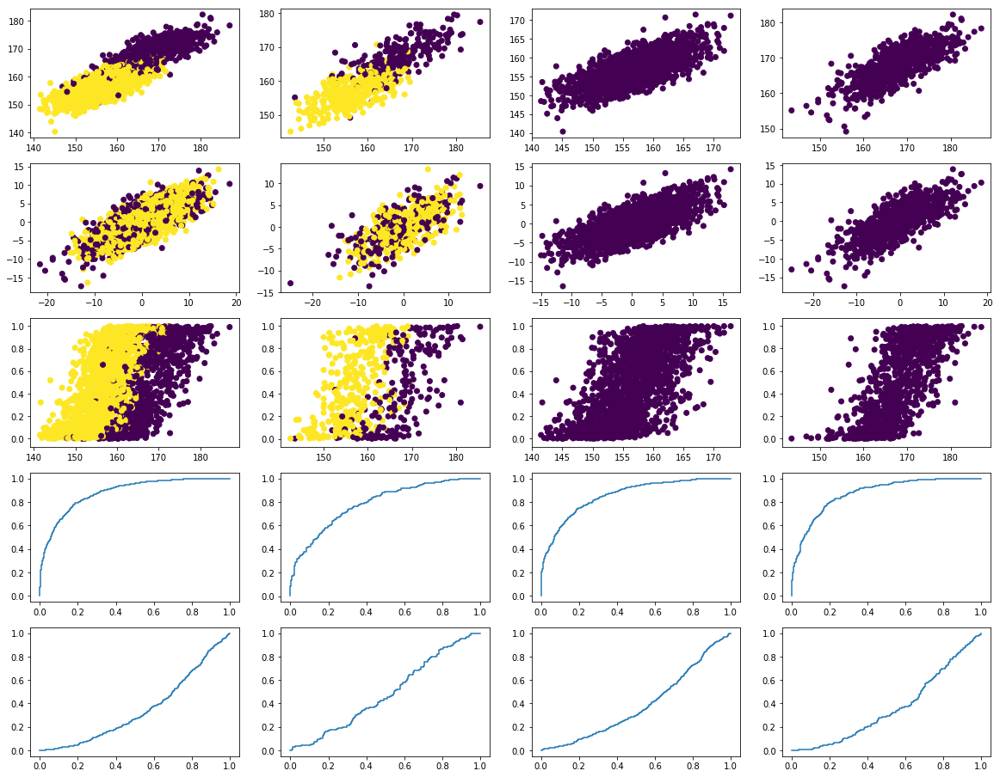

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.880365  0.350942
val     33.977128  0.437954  0.786966  0.484010
female  27.913720  0.004636  0.854008  0.388560
male    37.734385  0.005975  0.872436  0.361538
(1333, 7) (2747, 7) (2747, 1333)
2747 2197
(2747, 691)
[(2197, 691), (550, 691), (1758, 691), (989, 691)]


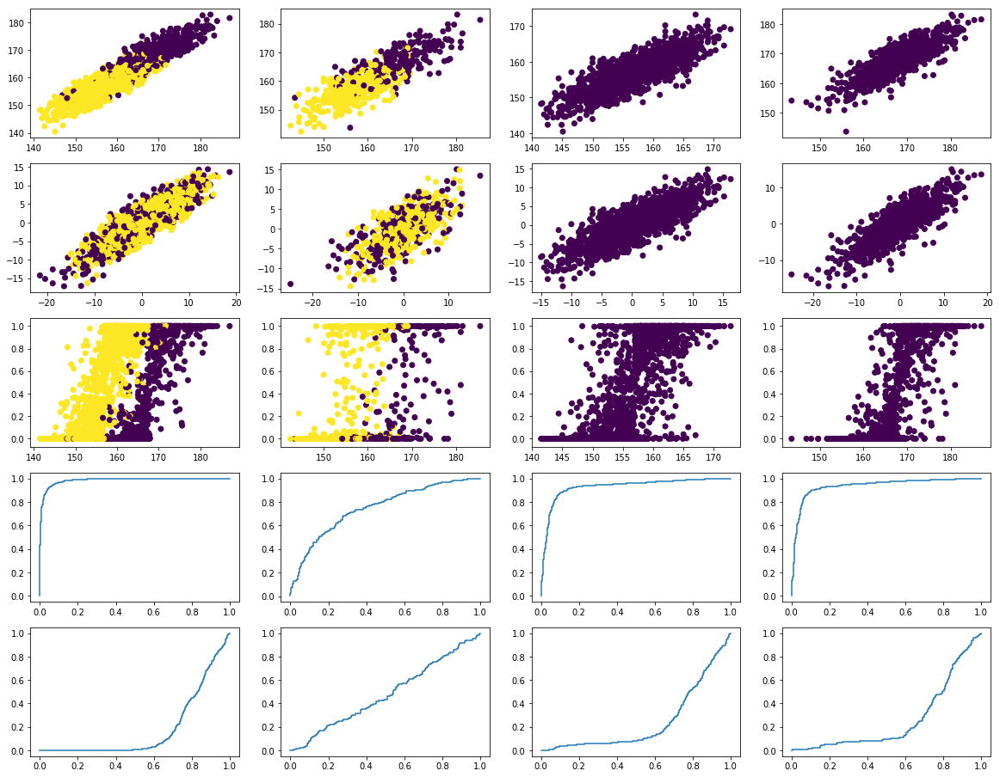

              MSE        R2     auc_b     auc_t
trn     30.816662  0.486180  0.985926  0.182932
val     33.977128  0.437954  0.750083  0.479406
female  27.913720  0.004636  0.929022  0.244773
male    37.734385  0.005975  0.937083  0.261321


In [128]:
results={}
for i,snp in zip([50,100,200,300,500],snp_list):
    print(i)
    results[i]=[tmp(tz_meta,s,tz_plink,rcol=['gender','nationality','pc1','pc2','pc3','pc4']) for s in [snp['tz_a'],set(snp['tz_a']+snp['tz_f']+snp['tz_m'])]]

In [129]:
results

{50: [(         rt        rv        rf        rm        ht        hv        hf  \
   r  0.144597  0.110146  0.115328  0.157789  0.559718  0.501879  0.120626   
   c  0.144597  0.110146  0.115328  0.157789  0.559718  0.501879  0.120626   
   b  0.144691  0.110432  0.115374  0.158043  0.559738  0.502050  0.120741   
   t  0.143241  0.112506  0.109256  0.164498  0.558744  0.502937  0.115039   
   
            hm  
   r  0.168371  
   c  0.168371  
   b  0.168442  
   t  0.173225  ,
             rt         rv         rf         rm         ht         hv  \
   r  26.530925  30.811571  24.809518  31.971359  26.406150  30.112669   
   c  26.530925  30.811571  24.809518  31.971359  26.406150  30.112669   
   b  26.528015  30.801661  24.808218  31.961693  26.404960  30.102350   
   t  26.572966  30.729868  24.979786  31.716653  26.464594  30.048748   
   
             hf         hm  
   r  24.660930  31.569631  
   c  24.660930  31.569631  
   b  24.657715  31.566963  
   t  24.817626  31.385376

# Remove outliers

In [130]:
tz_meta_row = tz_meta

In [140]:
tz_meta=tz_meta_row.loc[(tz_meta_row[['pc1','pc2','pc3','pc4']]< -0.005).sum(1)==0,:]

In [141]:
regr = gn_residual(tz_meta,t=False,col=['gender','nationality','pc1','pc2','pc3','pc4'])

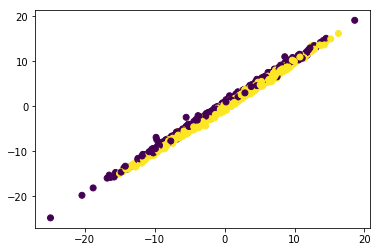

In [142]:
plt.scatter(tz_meta.residual,tz_meta.height-regr.predict(tz_meta[['gender','nationality','pc1','pc2','pc3','pc4']]),c=tz_meta.gender)

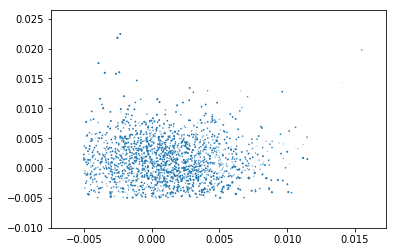

In [143]:
plt.scatter(tz_meta.pc1,tz_meta.pc2,s=(tz_meta.residual-(tz_meta.height-regr.predict(tz_meta[['gender','nationality','pc1','pc2','pc3','pc4']]))).abs())

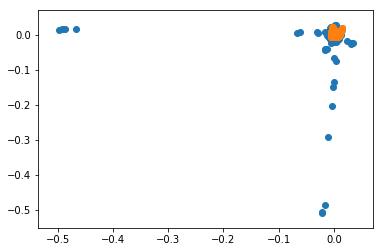

In [144]:
plt.scatter(pcs.pc1,pcs.pc2)
plt.scatter(tz_meta.pc1,tz_meta.pc2)

50
(50, 7) (1805, 7) (1805, 50)
1805 1444
(1805, 26)
[(1444, 26), (361, 26), (1185, 26), (620, 26)]


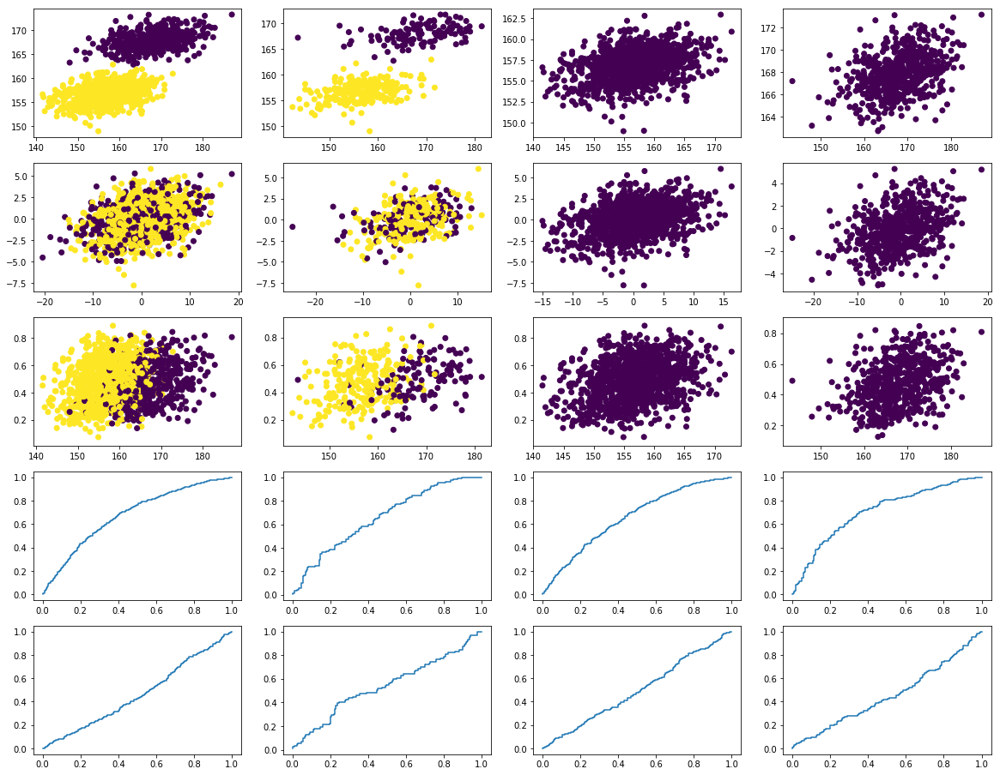

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.677406  0.463381
val     33.675549  0.489383  0.656198  0.540111
female  27.176807  0.000233  0.654695  0.495694
male    36.568110  0.001503  0.709005  0.451602
(141, 7) (1805, 7) (1805, 141)
1805 1444
(1805, 86)
[(1444, 86), (361, 86), (1185, 86), (620, 86)]


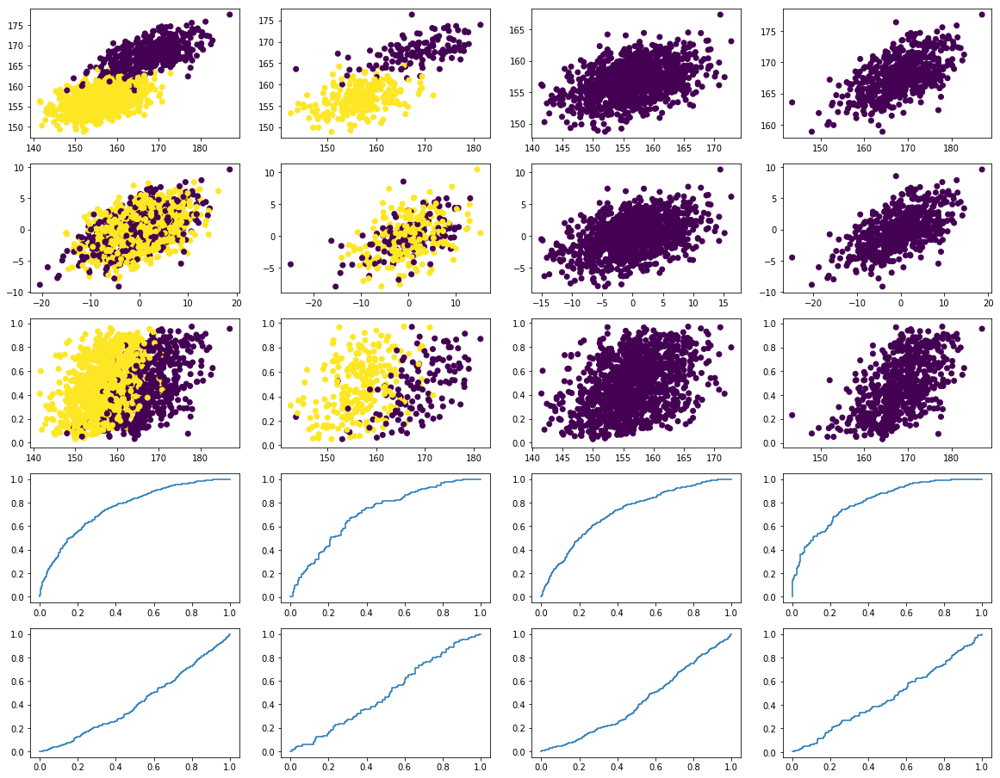

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.758756  0.421004
val     33.675549  0.489383  0.714097  0.494547
female  27.176807  0.000233  0.719020  0.421872
male    36.568110  0.001503  0.808785  0.462161
100
(100, 7) (1805, 7) (1805, 100)
1805 1444
(1805, 56)
[(1444, 56), (361, 56), (1185, 56), (620, 56)]


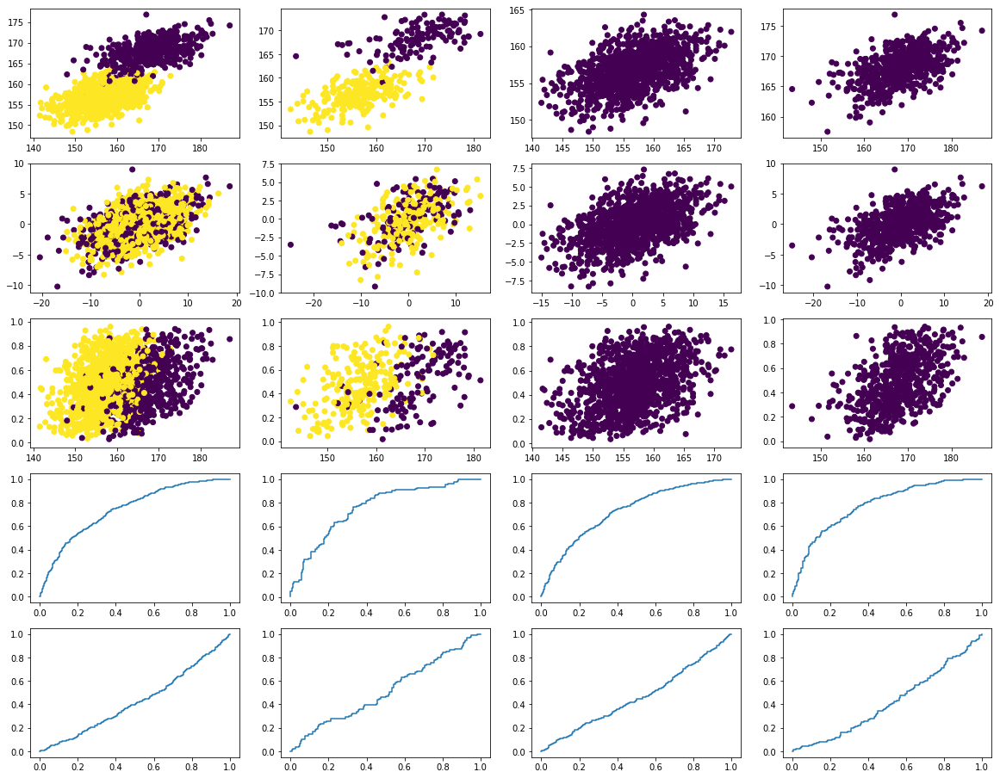

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.742264  0.427062
val     33.675549  0.489383  0.756953  0.514086
female  27.176807  0.000233  0.727587  0.462165
male    36.568110  0.001503  0.777971  0.414141
(270, 7) (1805, 7) (1805, 270)
1805 1444
(1805, 160)
[(1444, 160), (361, 160), (1185, 160), (620, 160)]


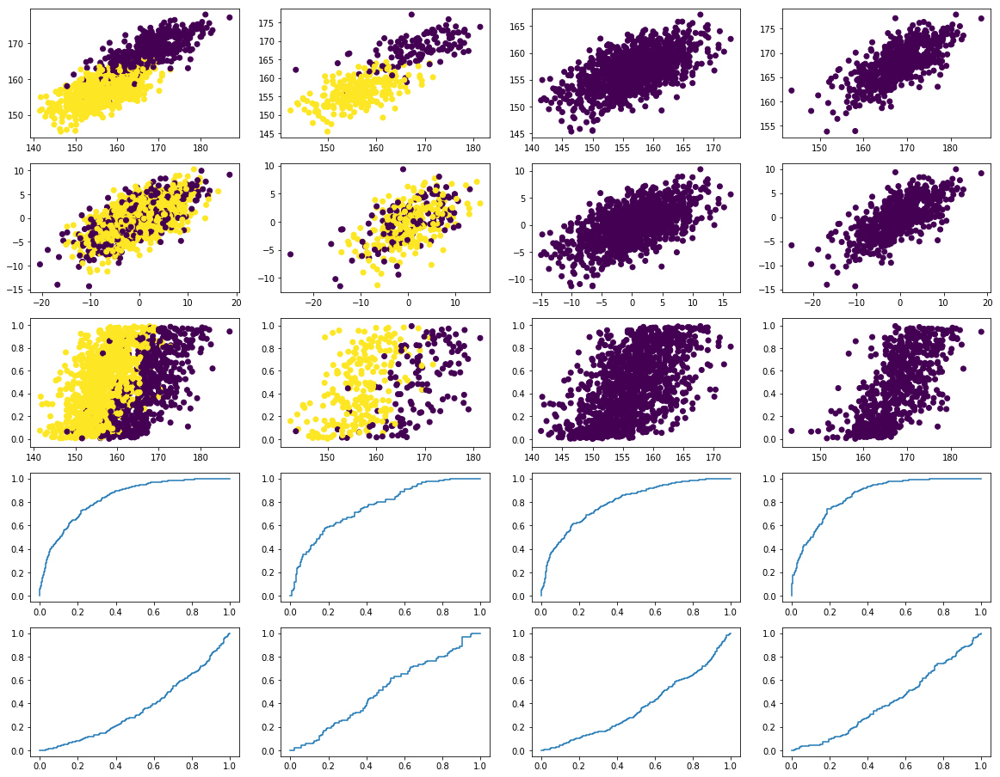

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.833338  0.359736
val     33.675549  0.489383  0.759624  0.508510
female  27.176807  0.000233  0.799313  0.376173
male    36.568110  0.001503  0.852088  0.414355
200
(200, 7) (1805, 7) (1805, 200)
1805 1444
(1805, 110)
[(1444, 110), (361, 110), (1185, 110), (620, 110)]


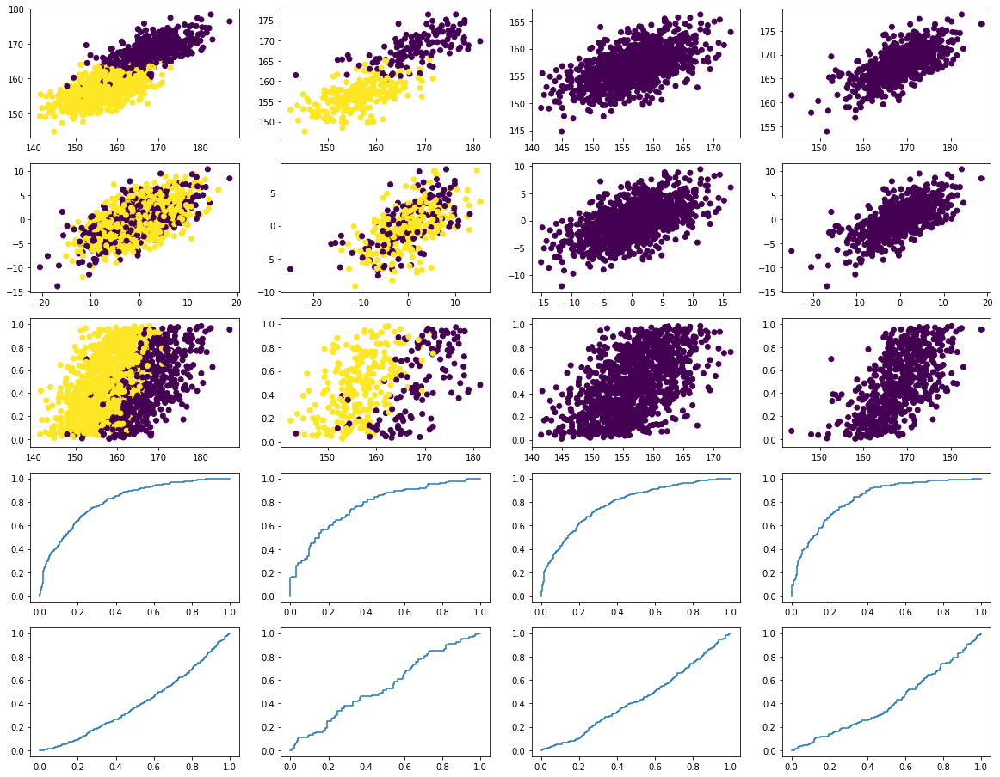

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.807010  0.400286
val     33.675549  0.489383  0.772610  0.547298
female  27.176807  0.000233  0.784656  0.438444
male    36.568110  0.001503  0.826779  0.414796
(542, 7) (1805, 7) (1805, 542)
1805 1444
(1805, 306)
[(1444, 306), (361, 306), (1185, 306), (620, 306)]


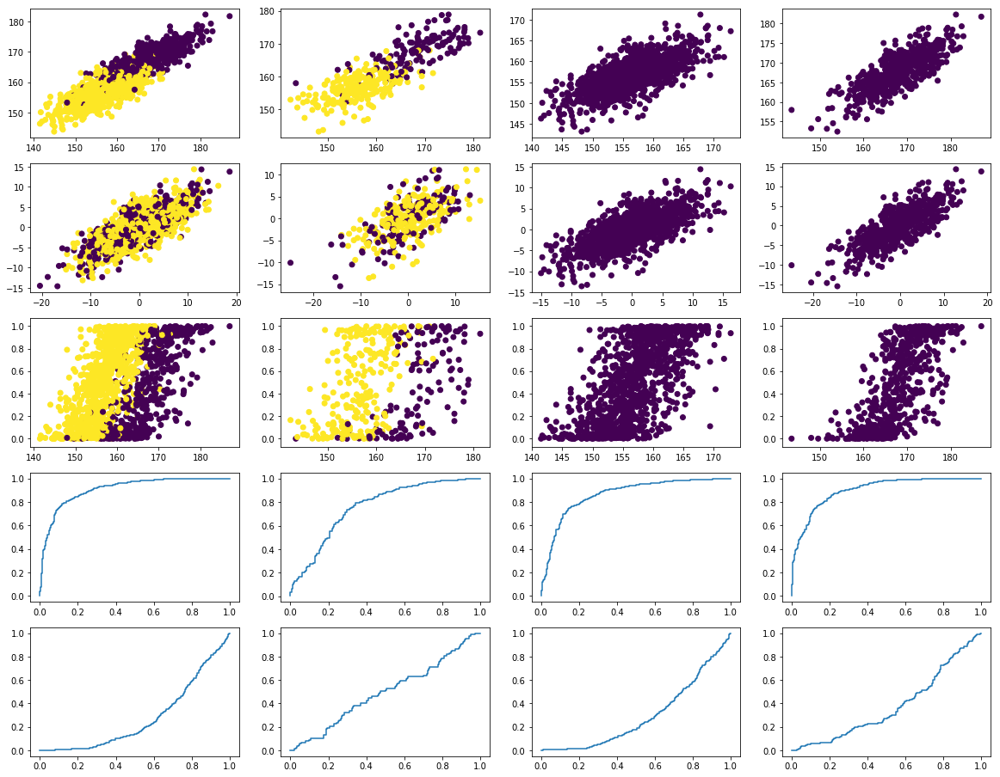

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.907563  0.278606
val     33.675549  0.489383  0.758151  0.494465
female  27.176807  0.000233  0.863675  0.295675
male    36.568110  0.001503  0.899564  0.377292
300
(300, 7) (1805, 7) (1805, 300)
1805 1444
(1805, 157)
[(1444, 157), (361, 157), (1185, 157), (620, 157)]


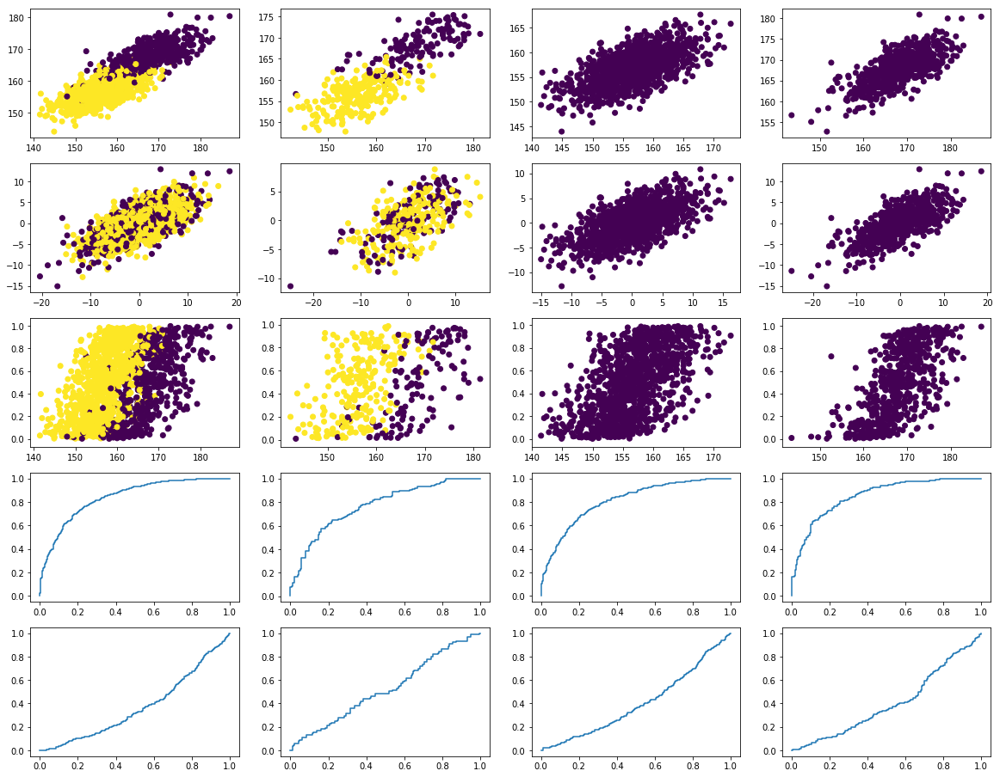

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.839171  0.371880
val     33.675549  0.489383  0.769049  0.521357
female  27.176807  0.000233  0.809749  0.403943
male    36.568110  0.001503  0.852567  0.400960
(808, 7) (1805, 7) (1805, 808)
1805 1444
(1805, 430)
[(1444, 430), (361, 430), (1185, 430), (620, 430)]


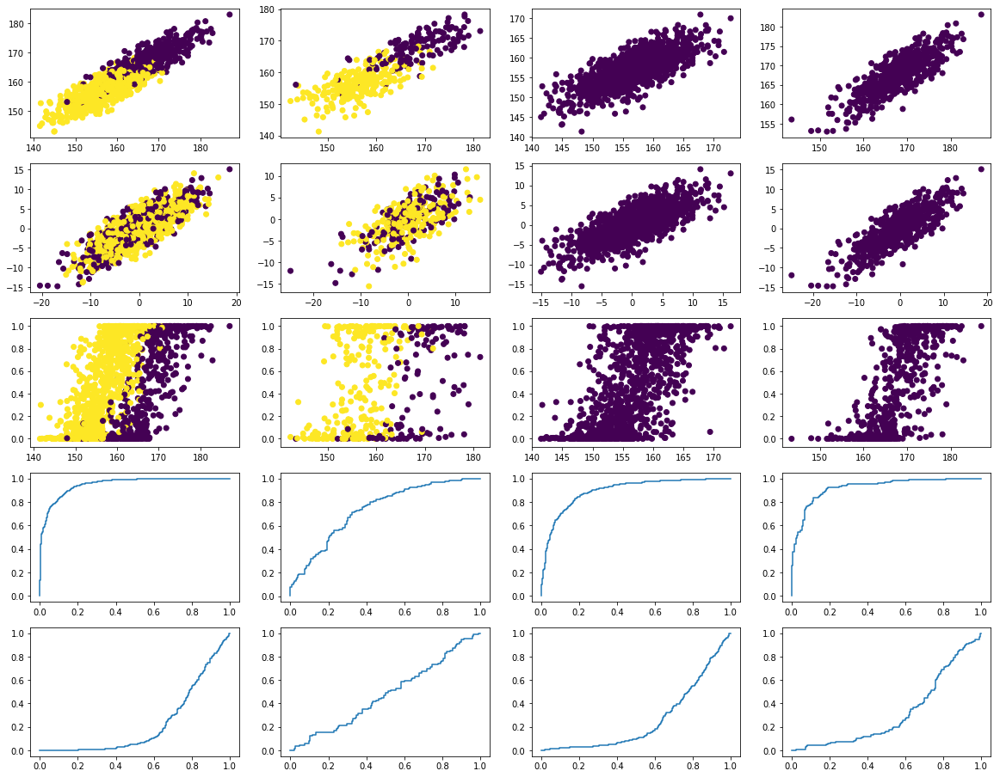

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.950310  0.225606
val     33.675549  0.489383  0.736262  0.476165
female  27.176807  0.000233  0.893780  0.260656
male    36.568110  0.001503  0.923729  0.318186
500
(500, 7) (1805, 7) (1805, 500)
1805 1444
(1805, 257)
[(1444, 257), (361, 257), (1185, 257), (620, 257)]


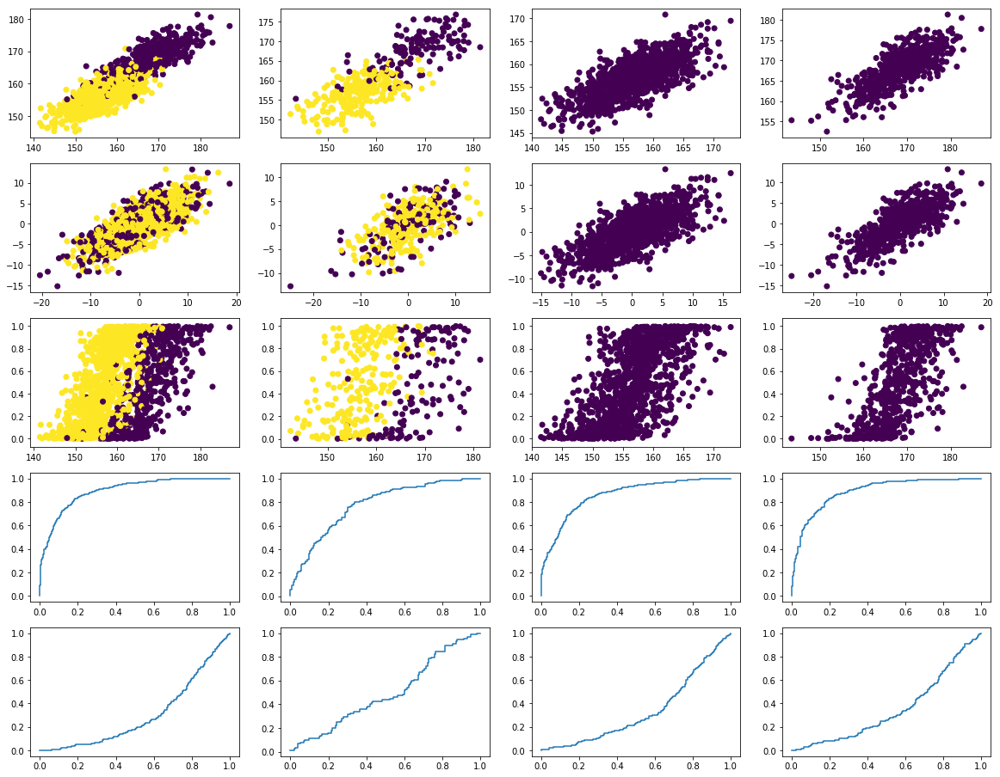

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.894072  0.299873
val     33.675549  0.489383  0.775158  0.490169
female  27.176807  0.000233  0.858878  0.335394
male    36.568110  0.001503  0.888241  0.350860
(1333, 7) (1805, 7) (1805, 1333)
1805 1444
(1805, 641)
[(1444, 641), (361, 641), (1185, 641), (620, 641)]


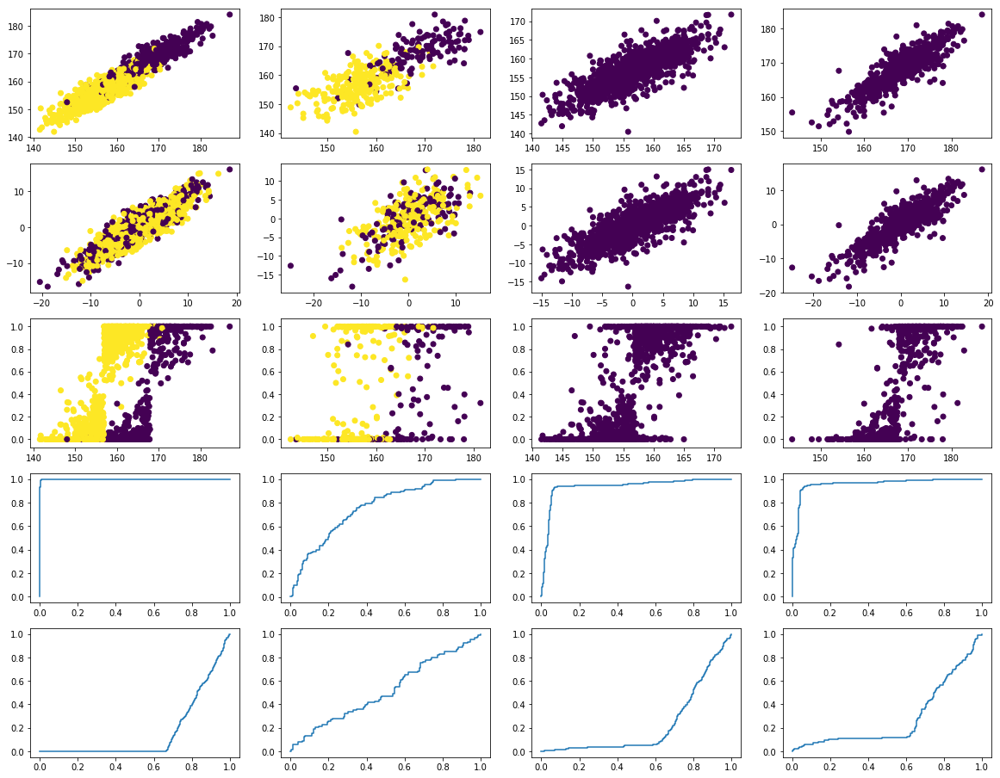

              MSE        R2     auc_b     auc_t
trn     29.584399  0.481117  0.999691  0.165919
val     33.675549  0.489383  0.755511  0.517143
female  27.176807  0.000233  0.936282  0.221584
male    36.568110  0.001503  0.958466  0.285484


In [145]:
results={}
for i,snp in zip([50,100,200,300,500],snp_list):
    print(i)
    results[i]=[tmp(tz_meta,s,tz_plink,rcol=['gender','nationality','pc1','pc2','pc3','pc4']) for s in [snp['tz_a'],set(snp['tz_a']+snp['tz_f']+snp['tz_m'])]]

In [139]:
results

{50: [(         rt        rv        rf        rm        ht        hv        hf  \
   r  0.137448  0.114167  0.109398  0.158194  0.543045  0.552956  0.113974   
   c  0.137448  0.114167  0.109398  0.158194  0.543045  0.552956  0.113974   
   b  0.137456  0.108748  0.107831  0.157570  0.543040  0.550211  0.112645   
   t  0.124992  0.105879  0.095085  0.150218  0.536240  0.549152  0.100107   
   
            hm  
   r  0.162065  
   c  0.162065  
   b  0.161101  
   t  0.153295  ,
             rt         rv         rf         rm         ht         hv  \
   r  26.498572  29.784916  24.729516  31.489491  26.370197  29.631264   
   c  26.498572  29.784916  24.729516  31.489491  26.370197  29.631264   
   b  26.498351  29.967129  24.773029  31.512812  26.370465  29.813181   
   t  26.881251  30.063596  25.126958  31.787852  26.762906  29.883400   
   
             hf         hm  
   r  24.602461  31.344673  
   c  24.602461  31.344673  
   b  24.639361  31.380730  
   t  24.987506  31.672741

(200, 7) (2747, 7) (2747, 200)
2747 2197
(2747, 110)


/home/ahmadA/anaconda3/envs/fastai/lib/python3.6/site-packages/sklearn/utils/__init__.py:54: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


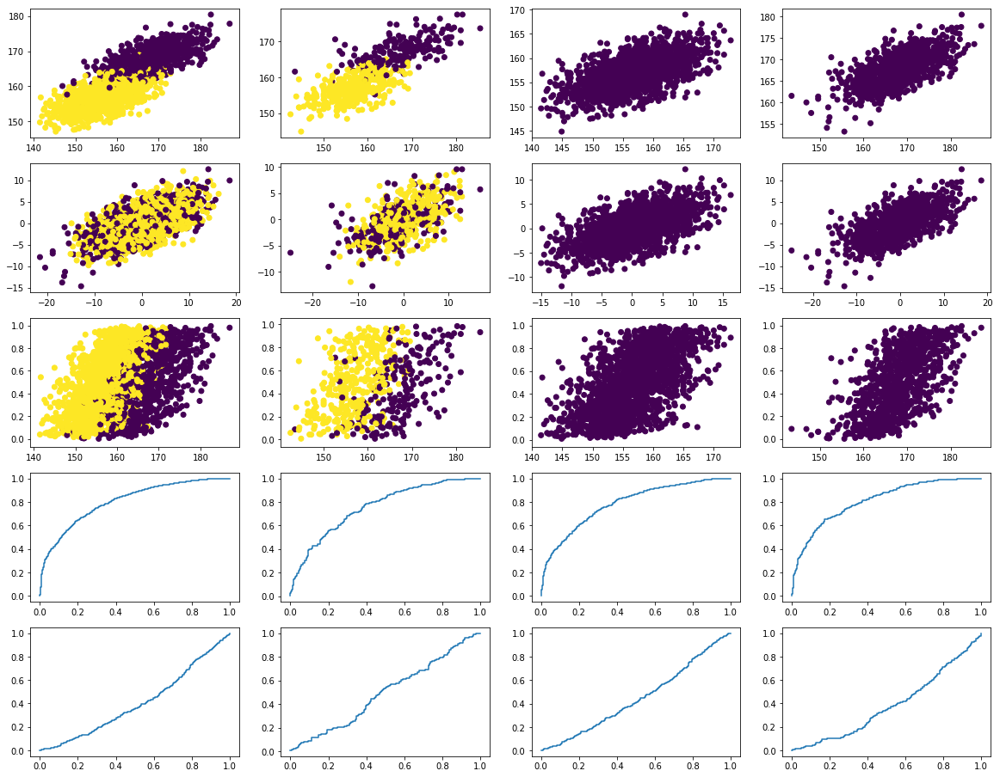

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.804324  0.405126
val     34.328853  0.432136  0.754395  0.492709
female  28.043737  0.000000  0.784712  0.445551
male    37.961214  0.000000  0.809433  0.384835


(         rt        rv        rf        rm        ht        hv        hf  \
 r  0.382623  0.322647  0.330356  0.415228  0.682708  0.614341  0.332897   
 c  0.382623  0.322647  0.330356  0.415228  0.682708  0.614341  0.332897   
 b  0.381741  0.320420  0.330307  0.412563  0.682191  0.613070  0.333028   
 t  0.375819  0.309053  0.322234  0.406650  0.679487  0.606083  0.325909   
 
          hm  
 r  0.420878  
 c  0.420878  
 b  0.417766  
 t  0.411435  ,
           rt         rv         rf         rm         ht         hv  \
 r  19.148389  23.453634  18.779326  22.198639  19.029759  23.314052   
 c  19.148389  23.453634  18.779326  22.198639  19.029759  23.314052   
 b  19.175728  23.530738  18.780684  22.299837  19.060766  23.390897   
 t  19.359393  23.924341  19.007094  22.524268  19.222970  23.813293   
 
           hf         hm  
 r  18.708060  21.984167  
 c  18.708060  21.984167  
 b  18.704387  22.102310  
 t  18.904035  22.342653  )

In [46]:
tmp(tz_meta,snp_list[2]['tz_a'],tz_plink,ml=linear_model.HuberRegressor())

(200, 7) (2747, 7) (2747, 200)
2747 2197
(2747, 134)


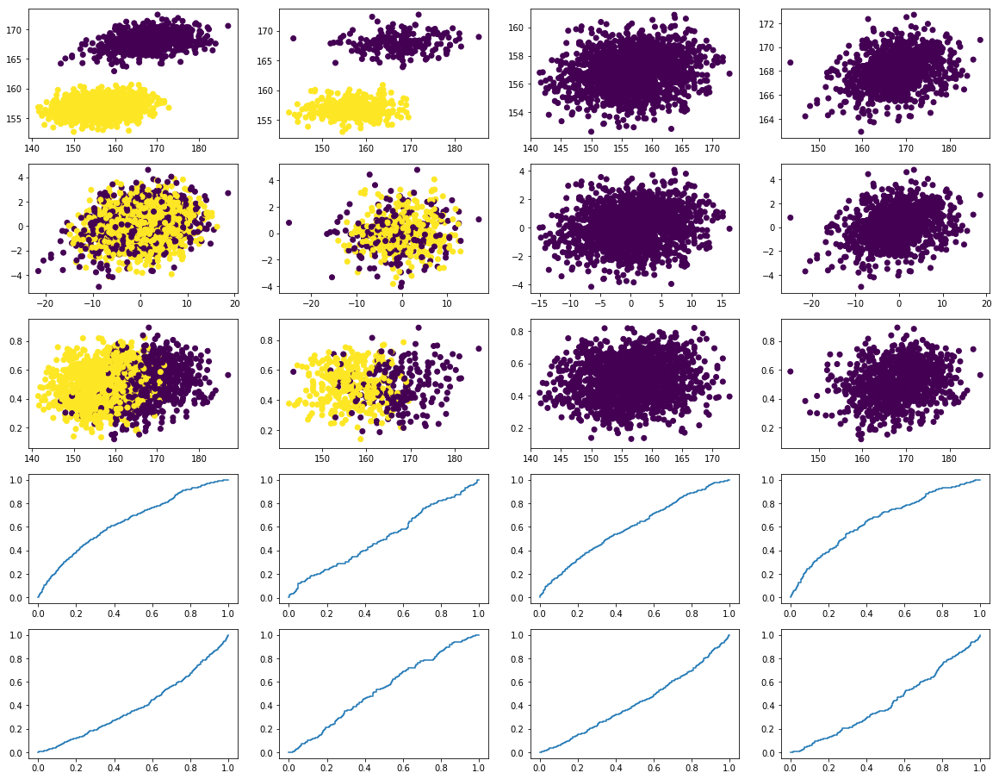

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.644103  0.394067
val     34.328853  0.432136  0.513673  0.537118
female  28.043737  0.000000  0.594220  0.425512
male    37.961214  0.000000  0.656170  0.421434


(         rt        rv        rf        rm        ht        hv        hf  \
 r  0.059704 -0.025089  0.018502  0.062259  0.515447  0.418188  0.020618   
 c  0.059704 -0.025089  0.018502  0.062259  0.515447  0.418188  0.020618   
 b  0.054759 -0.020940  0.014367  0.060818  0.513151  0.420656  0.017074   
 t  0.013697 -0.092057 -0.047252  0.031132  0.491958  0.380760 -0.044535   
 
          hm  
 r  0.070202  
 c  0.070202  
 b  0.068982  
 t  0.040174  ,
           rt         rv         rf         rm         ht         hv  \
 r  29.163937  35.494148  27.524875  35.597796  29.061352  35.172044   
 c  29.163937  35.494148  27.524875  35.597796  29.061352  35.172044   
 b  29.317316  35.350475  27.640846  35.652475  29.199087  35.022816   
 t  30.590876  37.812946  29.368854  36.779403  30.470108  37.434621   
 
           hf         hm  
 r  27.465526  35.296279  
 c  27.465526  35.296279  
 b  27.564919  35.342582  
 t  29.292670  36.436152  )

In [48]:
snp = set(snp_list[2]['os_a'])
tmp(tz_meta,snp,tz_plink)

(200, 7) (2747, 7) (2747, 200)
2747 2197
(2747, 68)


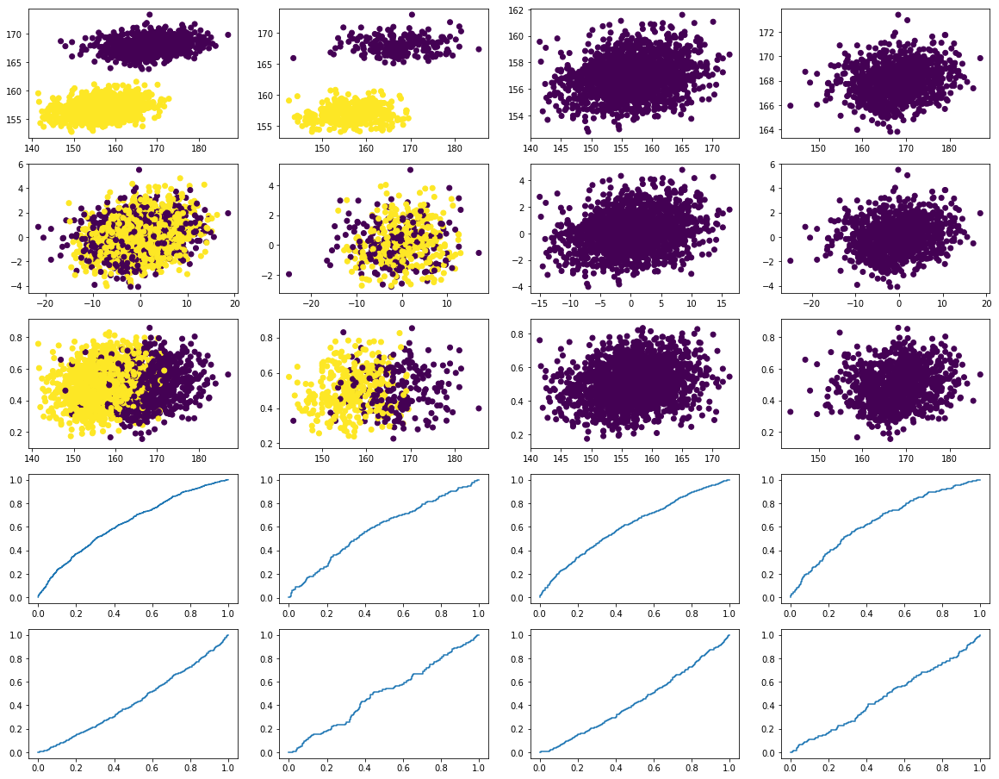

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.632363  0.434660
val     34.328853  0.432136  0.584331  0.498206
female  28.043737  0.000000  0.608187  0.434464
male    37.961214  0.000000  0.648073  0.471495


(         rt        rv        rf        rm        ht        hv        hf  \
 r  0.059530 -0.021008  0.045245  0.028895  0.514718  0.420455  0.046123   
 c  0.059530 -0.021008  0.045245  0.028895  0.514718  0.420455  0.046123   
 b  0.059998 -0.017021  0.045470  0.031472  0.514912  0.422813  0.046690   
 t  0.036199 -0.055627  0.015953  0.007454  0.502757  0.401015  0.017206   
 
          hm  
 r  0.036158  
 c  0.036158  
 b  0.038184  
 t  0.014935  ,
           rt         rv         rf         rm         ht         hv  \
 r  29.169336  35.352828  26.774893  36.864332  29.105093  35.034984   
 c  29.169336  35.352828  26.774893  36.864332  29.105093  35.034984   
 b  29.154811  35.214770  26.768595  36.766483  29.093430  34.892420   
 t  29.892973  36.551513  27.596352  37.678268  29.822470  36.210174   
 
           hf         hm  
 r  26.750284  36.588606  
 c  26.750284  36.588606  
 b  26.734375  36.511694  
 t  27.561228  37.394260  )

In [55]:
snp = set(snp_list[2]['other'])
#snp.remove('rs34539857')
tmp(tz_meta,snp,tz_plink)

In [57]:
from sklearn.ensemble import RandomForestRegressor

50
(50, 7) (2747, 7) (2747, 50)
2747 2197
(2747, 26)


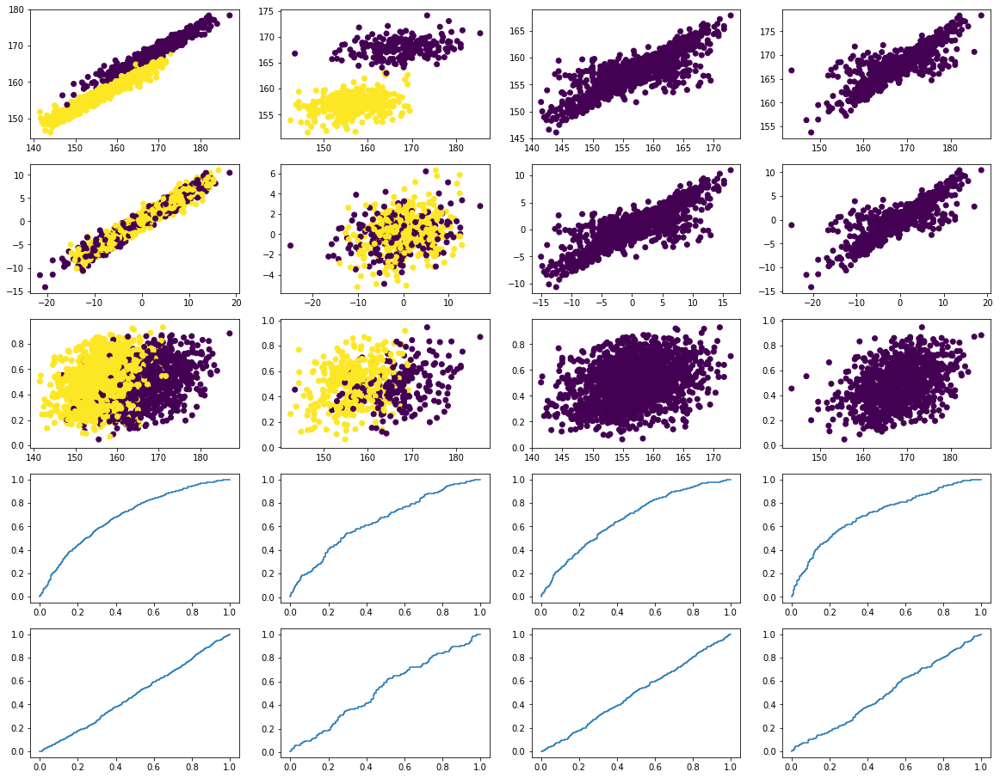

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.688923  0.483514
val     34.328853  0.432136  0.644843  0.533809
female  28.043737  0.000000  0.666160  0.493754
male    37.961214  0.000000  0.705637  0.493002
(141, 7) (2747, 7) (2747, 141)
2747 2197
(2747, 86)


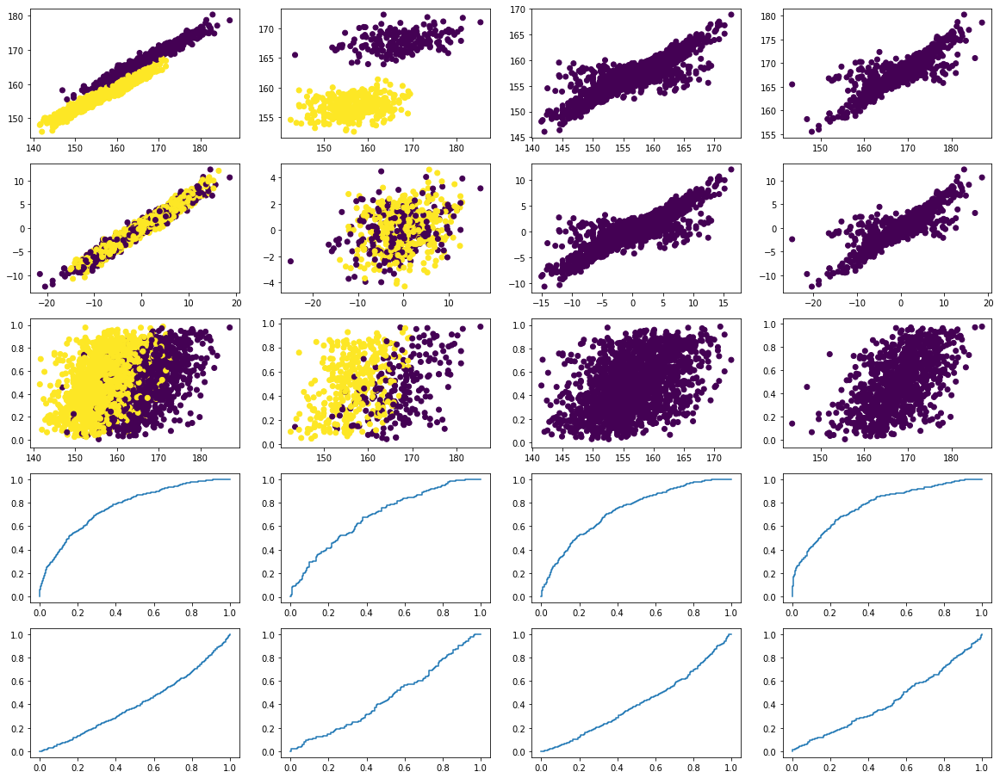

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.764935  0.407887
val     34.328853  0.432136  0.685602  0.457193
female  28.043737  0.000000  0.732731  0.411242
male    37.961214  0.000000  0.776201  0.430201
100
(100, 7) (2747, 7) (2747, 100)
2747 2197
(2747, 56)


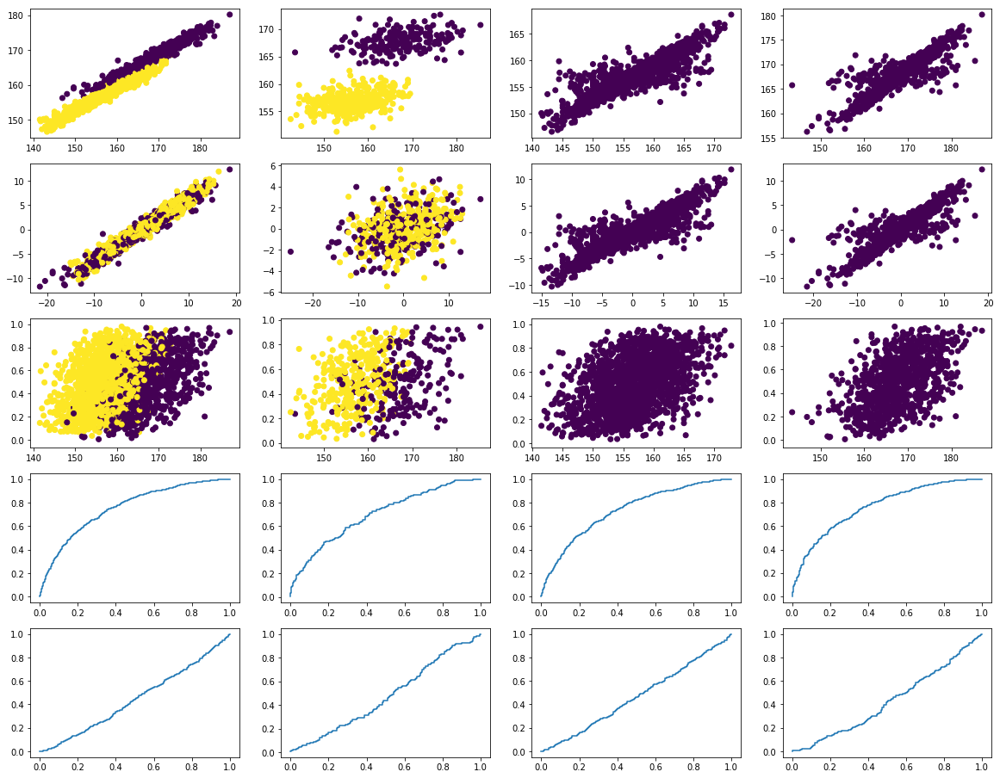

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.754883  0.445981
val     34.328853  0.432136  0.700419  0.473507
female  28.043737  0.000000  0.733327  0.466091
male    37.961214  0.000000  0.763054  0.426074
(270, 7) (2747, 7) (2747, 270)
2747 2197
(2747, 162)


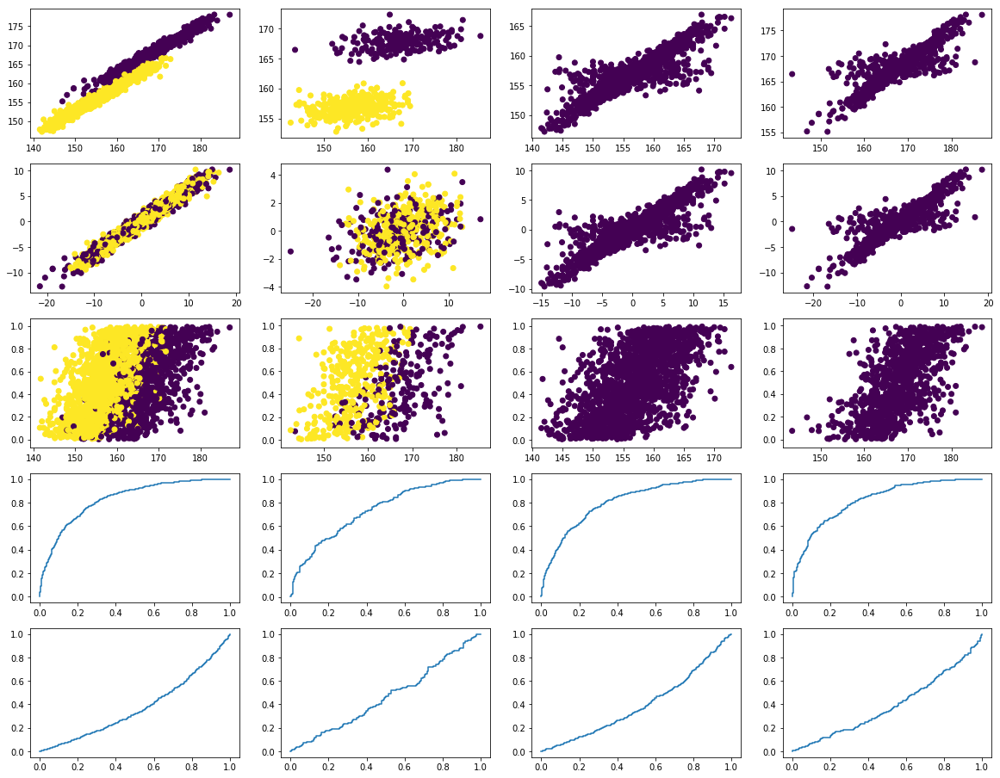

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.828789  0.374929
val     34.328853  0.432136  0.734366  0.465263
female  28.043737  0.000000  0.803938  0.394006
male    37.961214  0.000000  0.821272  0.391605
200
(200, 7) (2747, 7) (2747, 200)
2747 2197
(2747, 110)


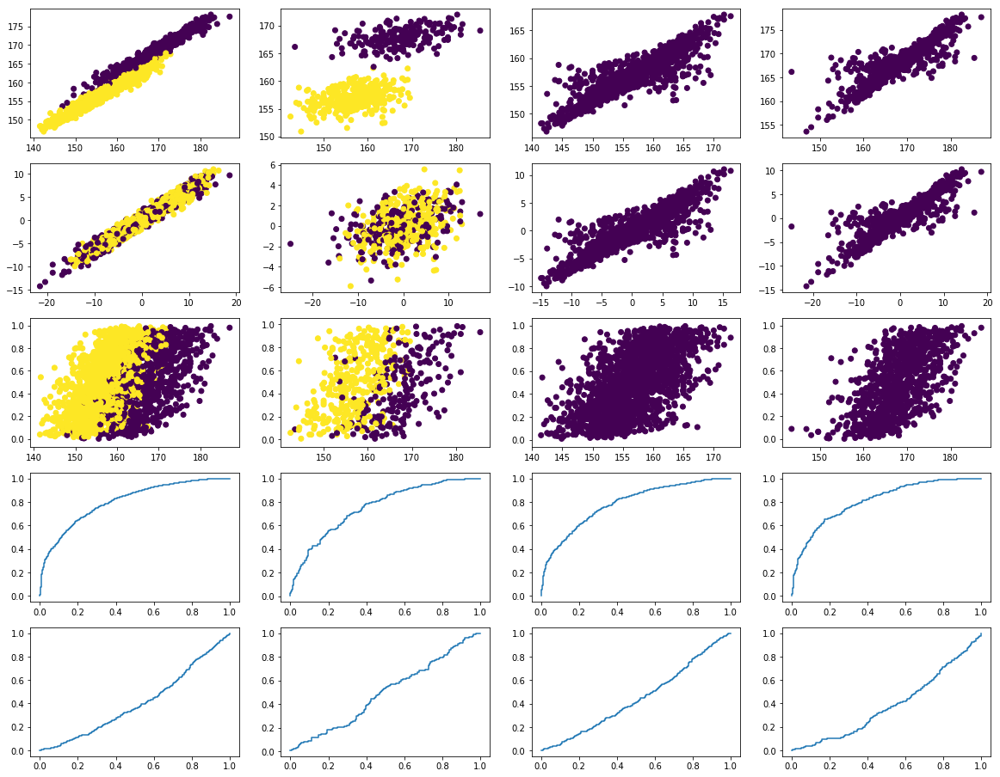

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.804324  0.405126
val     34.328853  0.432136  0.754395  0.492709
female  28.043737  0.000000  0.784712  0.445551
male    37.961214  0.000000  0.809433  0.384835
(542, 7) (2747, 7) (2747, 542)
2747 2197
(2747, 313)


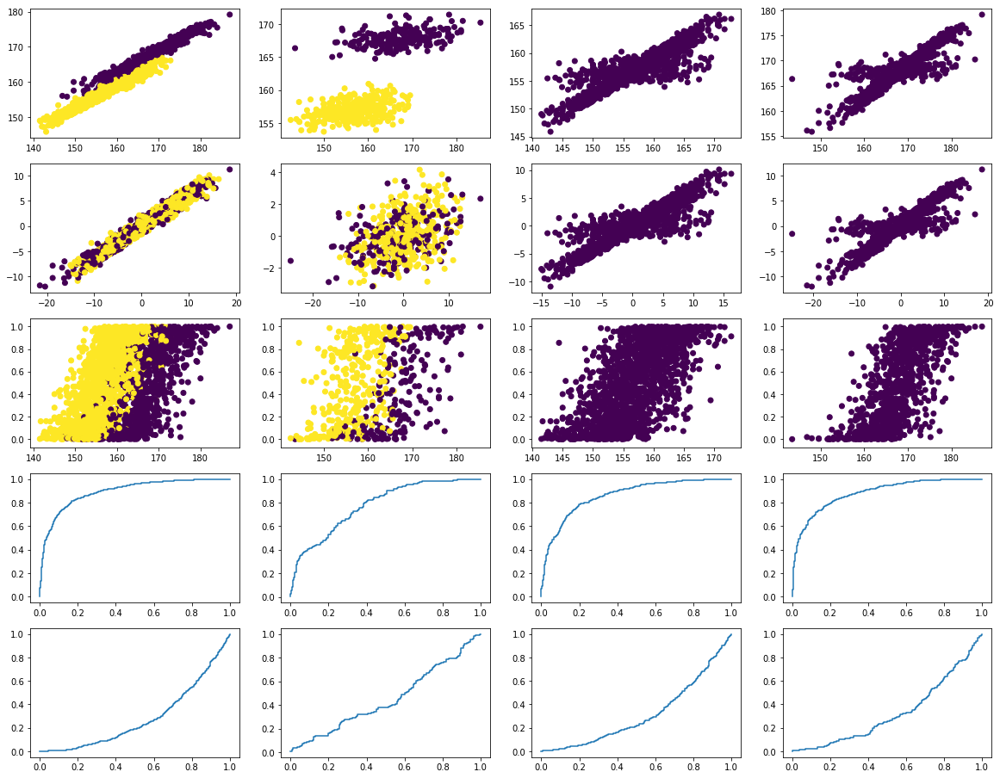

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.892712  0.284624
val     34.328853  0.432136  0.776833  0.449894
female  28.043737  0.000000  0.860822  0.315536
male    37.961214  0.000000  0.880333  0.327553
300
(300, 7) (2747, 7) (2747, 300)
2747 2197
(2747, 158)


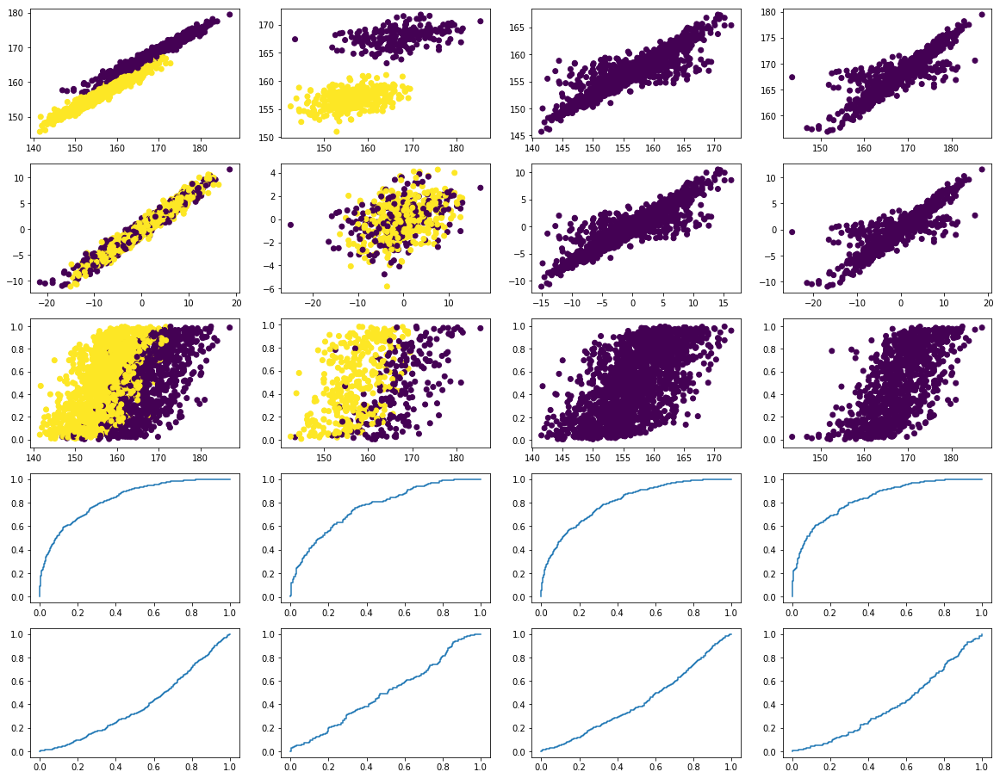

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.828847  0.390364
val     34.328853  0.432136  0.766262  0.499221
female  28.043737  0.000000  0.806523  0.424368
male    37.961214  0.000000  0.832383  0.393107
(808, 7) (2747, 7) (2747, 808)
2747 2197
(2747, 447)


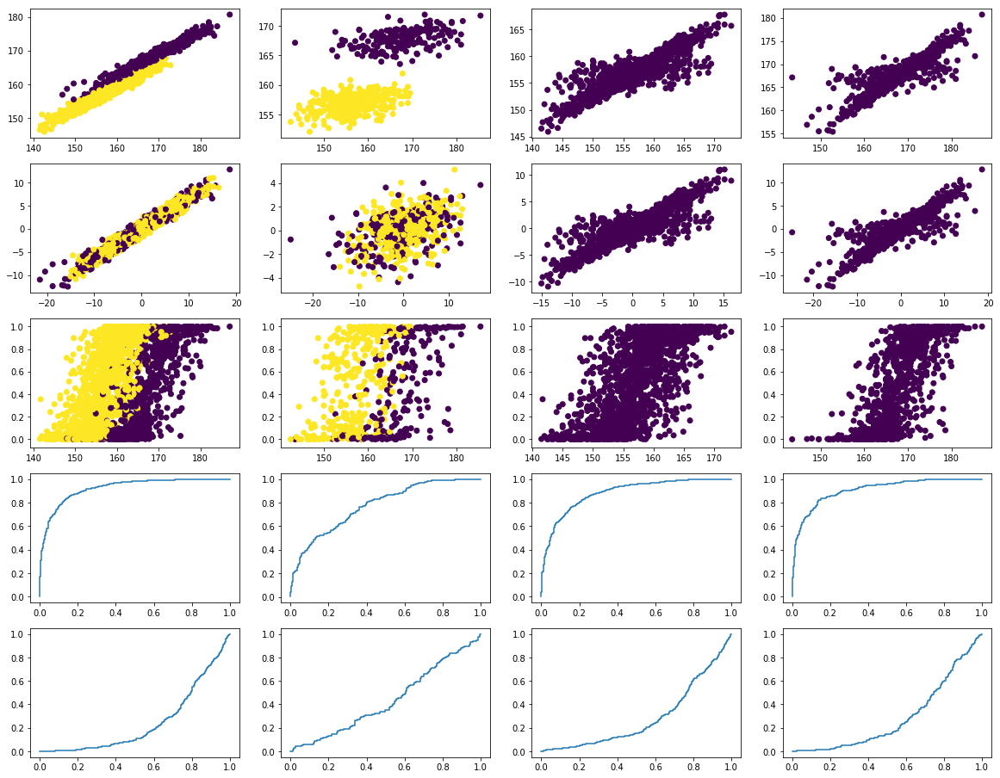

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.923388  0.245233
val     34.328853  0.432136  0.775867  0.433388
female  28.043737  0.000000  0.883760  0.285631
male    37.961214  0.000000  0.907782  0.288001
500
(500, 7) (2747, 7) (2747, 500)
2747 2197
(2747, 261)


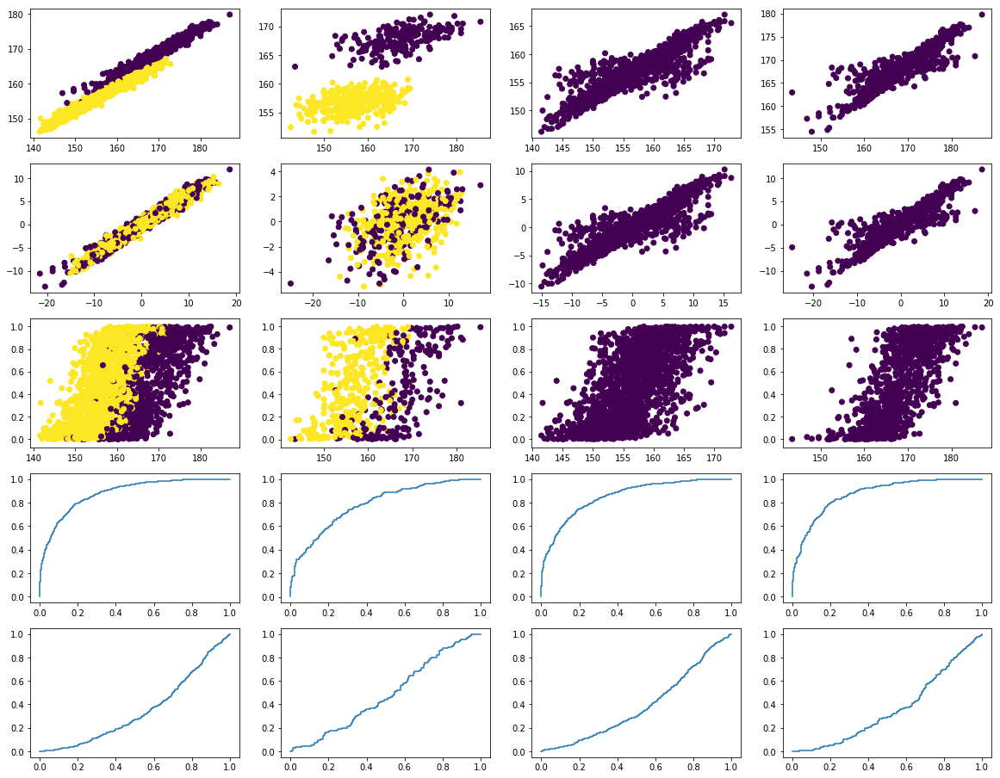

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.880365  0.350942
val     34.328853  0.432136  0.786966  0.484010
female  28.043737  0.000000  0.854008  0.388560
male    37.961214  0.000000  0.872436  0.361538
(1333, 7) (2747, 7) (2747, 1333)
2747 2197
(2747, 691)


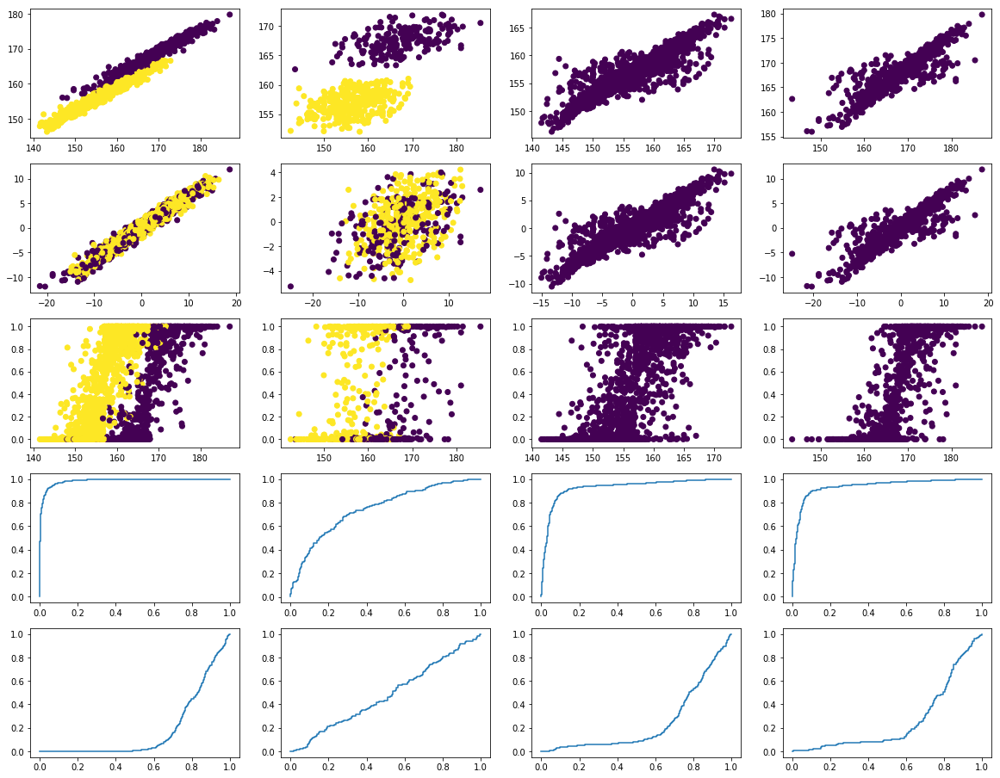

              MSE        R2     auc_b     auc_t
trn     30.934757  0.484211  0.985926  0.182932
val     34.328853  0.432136  0.750083  0.479406
female  28.043737  0.000000  0.929022  0.244773
male    37.961214  0.000000  0.937083  0.261321


In [58]:
m=RandomForestRegressor(n_estimators=40, max_features=0.99, min_samples_leaf=2,n_jobs=-1, oob_score=True)
results_rf={}
for i,snp in zip([50,100,200,300,500],snp_list):
    print(i)
    results_rf[i]=[tmp(tz_meta,s,tz_plink,ml=m) for s in [snp['tz_a'],set(snp['tz_a']+snp['tz_f']+snp['tz_m'])]]

In [88]:
results_rf

{50: [(         rt        rv        rf        rm        ht        hv        hf  \
   r  0.829749  0.055721  0.669923  0.645455  0.911214  0.463448  0.669218   
   c  0.829749  0.055721  0.669923  0.645455  0.911214  0.463448  0.669218   
   b  0.620228  0.074193  0.502434  0.494486  0.803449  0.473626  0.502475   
   t  0.586734  0.081805  0.464275  0.487664  0.786022  0.478217  0.465235   
   
            hm  
   r  0.647586  
   c  0.647586  
   b  0.497339  
   t  0.489143  ,
             rt         rv         rf         rm         ht         hv  \
   r   5.280459  32.696054   9.256588  13.458965   5.324979  32.435957   
   c   5.280459  32.696054   9.256588  13.458965   5.324979  32.435957   
   b  11.778879  32.056458  13.953598  19.189912  11.788245  31.820688   
   t  12.817731  31.792900  15.023719  19.448889  12.833451  31.543126   
   
             hf         hm  
   r   9.276358  13.378075  
   c   9.276358  13.378075  
   b  13.952466  19.081615  
   t  14.996799  19.392758

In [59]:
def tmp(meta,snp,tz_plink,ml=linear_model.LinearRegression(),regr=regr,rcol=['gender','nationality']):

    tz_snp_index = [i for i,x in enumerate(tz_plink[0].snp) if x in snp]
    tz_sample_index = [i for i,x in enumerate(tz_plink[1].iid) if x in list(meta.index)]
    tz_sub=plink_slice(tz_plink,tz_snp_index,tz_sample_index)
    
    all_bim = tz_sub[0]
    all_fam = tz_sub[1]
    all_bed_T= pd.DataFrame(tz_sub[2].compute()).T
    all_bed_T.fillna(-1,inplace=True)
    all_bed_T.index = list(all_fam.iid)
    all_bed_T.columns=list(all_bim.snp)
    print(all_bim.shape,all_fam.shape,all_bed_T.shape)
    
    samp_size=len(meta)
    train_ratio = 0.8
    train_size = int(samp_size * train_ratio)
    random.seed(1)
    val_idx = random.sample(range(samp_size), samp_size-train_size)
    print(samp_size,train_size)
    
    m=ml
    X = all_bed_T
    y = meta
    mr = regr
    
    R2,MSE = super_model(m,X,y,val_idx,mr,pca=True,rcol=rcol)
    
    return R2,MSE

In [63]:
def super_model(m,X,y,val_idx,mr,pca=True,rcol=['gender','nationality']):
    #pca
    if pca:        
        pca = PCA(.95)
        X=pd.DataFrame(pca.fit_transform(X))
        print(X.shape)
    #data    
    ((val,trn), (y_val,y_trn)) = split_by_idx(val_idx, X.values, np.array(y.residual))
    ((gn_val,gn_trn),(gn_y_val,gn_y_trn)) = split_by_idx(val_idx, y[rcol].values, np.array(y.height))
    ((yb_val,yb_trn),(yt_val,yt_trn)) = split_by_idx(val_idx,y.biclass,y.triclass)
     
    tz_idx = boo2idx(y.gender==2)
    ((tz,os), (y_tz,y_os)) = split_by_idx(tz_idx, X.values, np.array(y.residual))
    ((gn_tz,gn_os),(gn_y_tz,gn_y_os)) = split_by_idx(tz_idx, y[rcol].values, np.array(y.height))
    ((yb_tz,yb_os),(yt_tz,yt_os)) = split_by_idx(tz_idx,y.biclass,y.triclass)
    print([x.shape for x in [trn,val,tz,os]])
    
    #sv_idx = boo2idx(gn_val[:,0]==2)
    #((val_f,val_m), (y_val_f,y_val_m)) = split_by_idx(sv_idx, val, y_val)
    #((gn_val_f,gn_val_m),(gn_y_val_f,gn_y_val_m)) = split_by_idx(sv_idx, gn_val, gn_y_trn)
    #((yb_val_f,yb_val_m),(yt_val_f,yt_val_m)) = split_by_idx(sv_idx,yb_val,yt_val)
    #model
    ml = m
    ml.fit(trn, y_trn)
    
    mb = linear_model.LogisticRegression()
    mb.fit(trn, yb_trn)
    
    mt = linear_model.LogisticRegression()
    mt.fit(trn, yt_trn)
    
    #
    yr = [y_trn,y_val,y_tz,y_os]
    yh = [gn_y_trn,gn_y_val,gn_y_tz,gn_y_os]
    yb = [yb_trn,yb_val,yb_tz,yb_os]
    yt = [yt_trn,yt_val,yt_tz,yt_os]
    gd = [gn_trn[:,0],gn_val[:,0],gn_tz[:,0],gn_os[:,0]]
    #pred
    pbase = model_pred(mr,[gn_trn,gn_val,gn_tz,gn_os])
    pr = model_pred(ml,[trn,val,tz,os])
    pbi = model_pred(mb,[trn,val,tz,os])
    pbi_prob = model_pred(mb,[trn,val,tz,os],p=True)
    ptri =  model_pred(mt,[trn,val,tz,os])
    ptri_prob = model_pred(mt,[trn,val,tz,os],p=True)
    ph = [x+y for x,y in zip(pr,pbase)]
    pr_c = [np.clip(x,-20,20) for x in pr]
    ph_c = [x+y for x,y in zip(pr_c,pbase)]
    pr_b = [biclip(x,b) for x,b in zip(pr_c,pbi)]
    ph_b = [x+y for x,y in zip(pr_b,pbase)]
    pr_t = [triclip(x,b,t) for x,b,t in zip(pr_c,pbi,ptri)]
    ph_t = [x+y for x,y in zip(pr_t,pbase)]
    
    fpr_b,tpr_b,auc_b=[],[],[]
    for y,scores in zip(yb,pbi_prob):
        #print(y,scores)
        fpr, tpr, _ = metrics.roc_curve(y, scores)
        auc_b.append(metrics.auc(fpr, tpr))
        fpr_b.append(fpr)
        tpr_b.append(tpr)
    #print('auc_b',auc_b)
    fpr_t,tpr_t,auc_t=[],[],[]
    for y,scores in zip(yt,ptri_prob):
        fpr, tpr, _ = metrics.roc_curve(y, scores,pos_label=1)
        auc_t.append(metrics.auc(fpr, tpr))
        fpr_t.append(fpr)
        tpr_t.append(tpr)  
    #print('auc_t',auc_t)
    f, axs = plt.subplots(5, 4,figsize=(20, 16))
    axs = axs.ravel()
    for i,x,y,z in zip(list(range(12)),yh+yr+yh,ph+pr+pbi_prob,gd+gd+gd):
        #print(i,x,y)
        axs[i].scatter(x,y,marker='o',c=z)
    for i,x,y in zip(list(range(12,21)),fpr_b+fpr_t,tpr_b+tpr_t):
        axs[i].plot(x,y)
    plt.show()
    
    print(pd.DataFrame({
        'auc_b':auc_b,
        'auc_t':auc_t,
        'R2':[metrics.r2_score(x,y) for x,y in zip(yh,pbase)],
        'MSE':[metrics.mean_squared_error(x,y) for x,y in zip(yh,pbase)]
    },index=['trn','val','female','male']))
    
    R2 = pd.DataFrame.from_records([[metrics.r2_score(x,y) for x,y in zip(yr+yh,t)] 
           for t in [pr+ph,pr_c+ph_c,pr_b+ph_b,pr_t+ph_t]],index=['r','c','b','t'],
                                  columns=['rt','rv','rf','rm','ht','hv','hf','hm'])
    MSE = pd.DataFrame.from_records([[metrics.mean_squared_error(x,y) for x,y in zip(yr+yh,t)] 
           for t in [pr+ph,pr_c+ph_c,pr_b+ph_b,pr_t+ph_t]],index=['r','c','b','t'],
                                  columns=['rt','rv','rf','rm','ht','hv','hf','hm'])
    #max(ml.coef_),min(ml.coef_)
    return R2,MSE

In [ ]:
def train_model(m,X,y,val_idx,mr):
    ((val,trn), (y_val,y_trn)) = split_by_idx(val_idx, X.values, np.array(y.residual))
    ((gn_val,gn_trn),(gn_y_val,gn_y_trn)) = split_by_idx(val_idx, y[['gender','nationality']].values, np.array(y.height))

    ml = m
    ml.fit(trn, y_trn)


    pr_trn = np.clip(ml.predict(trn),-20,20)
    ph_trn = mr.predict(gn_trn)+pr_trn
    pr_val = np.clip(ml.predict(val),-20,20)
    ph_val = mr.predict(gn_val)+pr_val
    f, ((ax1, ax2),(ax3,ax4)) = plt.subplots(2, 2)
    ax1.scatter(y_trn,pr_trn,c=gn_trn[:,0], marker='o')
    ax2.scatter(y_val,pr_val,c=gn_val[:,0], marker='o')
    ax3.scatter(gn_y_trn,ph_trn,c=gn_trn[:,1], marker='o')
    ax4.scatter(gn_y_val,ph_val,c=gn_val[:,1], marker='o')

    plt.title(n);
    plt.show()

    score=(ml.score(trn, y_trn), ml.score(val, y_val),
                  rsqure(pr_trn,y_trn),rsqure(pr_val,y_val),
                  rsqure(ph_trn,gn_y_trn),rsqure(ph_val,gn_y_val),
                  max(ml.coef_),min(ml.coef_))
    return (ml,score)


In [176]:


def train_model(m,X,y,val_idx,mr):
    ((val,trn), (y_val,y_trn)) = split_by_idx(val_idx, X.values, np.array(y.residual))
    ((gn_val,gn_trn),(gn_y_val,gn_y_trn)) = split_by_idx(val_idx, y[['gender','nationality']].values, np.array(y.height))
    ((yb_val,yb_trn),(yt_val,yt_trn)) = split_by_idx(val_idx,y.biclass,y.triclass)
         
    ml = m
    ml.fit(trn, y_trn)
    
    mb = linear_model.LogisticRegression()
    mb.fit(trn, yb_trn)
    
    mt = linear_model.LogisticRegression()
    mt.fit(trn, yt_trn)

    pr_trn = np.clip(ml.predict(trn),-20,20)
    ph_trn = mr.predict(gn_trn)+pr_trn
    pr_val = np.clip(ml.predict(val),-20,20)
    ph_val = mr.predict(gn_val)+pr_val
    f, ((ax1, ax2),(ax3,ax4)) = plt.subplots(2, 2)
    ax1.scatter(y_trn,pr_trn,c=gn_trn[:,0], marker='o')
    ax2.scatter(y_val,pr_val,c=gn_val[:,0], marker='o')
    ax3.scatter(gn_y_trn,ph_trn,c=gn_trn[:,1], marker='o')
    ax4.scatter(gn_y_val,ph_val,c=gn_val[:,1], marker='o')

    plt.title(n);
    plt.show()
    pb_val = mb.predict(val)
    pt_val = mt.predict(val)
    tmp=pd.DataFrame({'yb':yb_val,'yt':yt_val,'pb':pb_val,'pt':pt_val,'v':1})
    print(tmp.pivot_table(['v'],index=['yb'],columns=['pb'],aggfunc=np.sum))
    print(tmp.pivot_table(['v'],index=['yt'],columns=['pt'],aggfunc=np.sum))
    
    f, ((ax1, ax2),(ax3,ax4)) = plt.subplots(2, 2)
    ax1.scatter(y_trn,pr_trn,c=gn_trn[:,0], marker='o')
    ax2.scatter(biclip(pr_val,pb_val,pt_val),pr_val,c=pt_val, marker='o')
    ax3.scatter(y_val,pr_val,c=pt_val, marker='o')
    ax4.scatter(y_val,biclip(pr_val,pb_val,pt_val),c=pt_val, marker='o')

    plt.title(n);
    plt.show()
    
    score=(ml.score(trn, y_trn), ml.score(val, y_val),
                  rsqure(pr_trn,y_trn),rsqure(pr_val,y_val),
                  rsqure(ph_trn,gn_y_trn),rsqure(ph_val,gn_y_val),
                  max(ml.coef_),min(ml.coef_))
    return (ml,mb,mt,score)

def topsnp_model(m,X,y,val_idx,mr,Xt,yt,topn=[500, 200, 100, 50, 20, 10]):
    score={}
    for n in topn: 
        var_idx = list(range(n))
        ml,mb,mt,score[n] = train_model(m,X.iloc[:,var_idx],y,val_idx,mr)
        ph_test = mr.predict(yt[['gender','nationality']].values)+biclip(np.clip(ml.predict(Xt.iloc[:,var_idx]),-20,20),mb.predict(Xt.iloc[:,var_idx]),mt.predict(Xt.iloc[:,var_idx]))
        challenge = crowdai.Challenge("OpenSNPChallenge2017", "02f5a9824254b85a068fbdfbb1298b8e")
        challenge.submit(ph_test.tolist())
        challenge.disconnect()
    return pd.DataFrame(score)

## 2.SNPs from GWAS of TZ2014

# Build Model

## Data Prepare

In [10]:
all_bed_T = pd.read_pickle(TMP_PATH/'all_bed_T_top10000.pk')

In [165]:
sum(tmp.astype(np.float32))

783.0

In [276]:
X = all_bed_T
X['gender'] = pd.Series(list(all_meta.gender),index=X.index)
X['nationality'] = pd.Series(list((all_meta.nationality=='PROBLEM').astype(np.int)),index=X.index)
X.fillna(-1,inplace=True)
y = all_meta.height

df_test = os_sub_test_align.T
df_test['gender']=pd.Series(list(os_meta_test.SNPSEX[[int(x) for x in list(os_plink_test[1].iid)]]),index=df_test.index)
df_test['nationality'] = 1
#Replace nan values in the training and testing set with an arbitrary number (-1)
df_test.fillna(-1,inplace=True)

### Linear model for os data

## Sample seperation

3530 2647


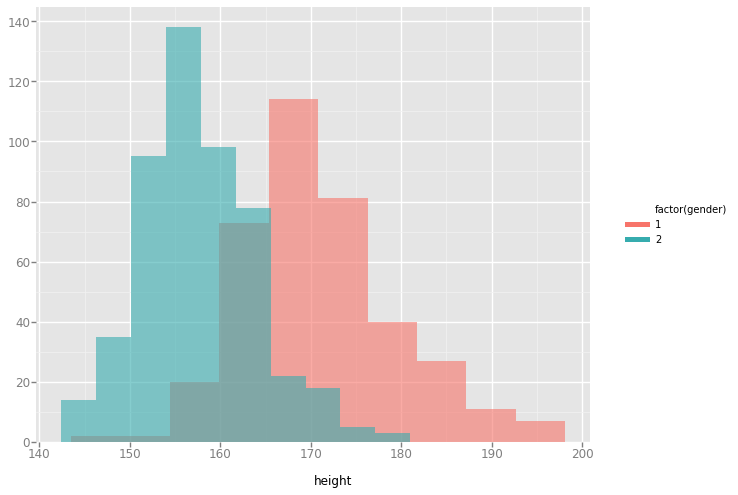

<ggplot: (-9223363300284316977)>

In [272]:
samp_size=len(all_meta)
train_ratio = 0.75
#train_ratio = 0.9
train_size = int(samp_size * train_ratio)

import random
val_idx = random.sample(range(samp_size), samp_size-train_size)
print(samp_size,train_size)
ggplot( aes(x='height',fill='factor(gender)'),data=all_meta.loc[val_idx]) +\
    geom_histogram(alpha=0.6)

## Random Forest

In [282]:
y = np.array(y)

In [283]:
from sklearn.ensemble import RandomForestRegressor
((val,trn), (y_val,y_trn)) = split_by_idx(val_idx, X.values, y)

m = RandomForestRegressor(n_estimators=40, max_features=0.99, min_samples_leaf=2,
                          n_jobs=-1, oob_score=True)
m.fit(trn, y_trn)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=0.99, max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=2,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=40, n_jobs=-1, oob_score=True, random_state=None,
           verbose=0, warm_start=False)

In [3]:
preds = m.predict(val)

NameError: name 'm' is not defined

In [285]:
m.score(trn, y_trn), m.score(val, y_val), m.oob_score_

(0.8439407662079724, 0.11804699118137751, 0.0804589756030738)

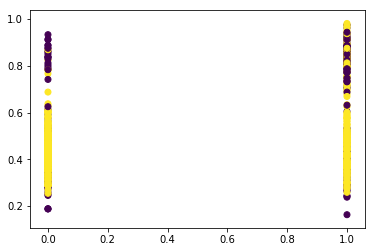

In [286]:
plt.scatter(y_val,preds,c=list(val[:,7726]), marker='o')

## NN1

In [ ]:
def NN_model()

In [85]:
def NN_Learner(meta,snp,tz_plink,ml=linear_model.LinearRegression(),regr=regr,pca=True):

    tz_snp_index = [i for i,x in enumerate(tz_plink[0].snp) if x in snp]
    tz_sample_index = [i for i,x in enumerate(tz_plink[1].iid) if x in list(meta.index)]
    tz_sub=plink_slice(tz_plink,tz_snp_index,tz_sample_index)
    
    all_bim = tz_sub[0]
    all_fam = tz_sub[1]
    all_bed_T= pd.DataFrame(tz_sub[2].compute()).T
    all_bed_T.fillna(-1,inplace=True)
    all_bed_T.index = list(all_fam.iid)
    all_bed_T.columns=list(all_bim.snp)
    print(all_bim.shape,all_fam.shape,all_bed_T.shape)
    
    samp_size=len(meta)
    train_ratio = 0.8
    train_size = int(samp_size * train_ratio)
    random.seed(1)
    val_idx = random.sample(range(samp_size), samp_size-train_size)
    print(samp_size,train_size)
    
    m=ml
    X = all_bed_T
    y = meta
    mr = regr
    
    m = nn_model(m,X,y,val_idx,mr,pca=pca)
    
    return m

In [89]:
def nn_model(m,X,y,val_idx,mr,pca=True):
    #pca
    if pca:        
        pca = PCA(.95)
        X=pd.DataFrame(pca.fit_transform(X))
        print(X.shape)
    #data
    X['gender']=pd.Series(list(y.gender),index=X.index)
    X['nationality']=pd.Series(list(y.nationality),index=X.index)
    #X=pd.concat([X, y[['gender','nationality']]], axis=1)
    print(X.shape)
    cat_vars = ['gender','nationality']
    y = y.residual
    md = ColumnarModelData.from_data_frame(PATH, val_idx, X, y.astype(np.float32), cat_flds=cat_vars, bs=64)
    cat_sz = [('gender',3),('nationality',2)]
    print(cat_sz)
    emb_szs = [(c, min(50, (c+1)//2)) for _,c in cat_sz]
    print(emb_szs)

    y_range = (130,210)

    m = md.get_learner(emb_szs, len(X.columns)-len(cat_vars),
                       0, 1, [256,128,64], [0.5,0.3,0])
    lr = 1e-3
    m.lr_find()
    m.sched.plot()
    m.fit(lr, 3,metrics=[metrics.r2_score,metrics.mean_squared_error], cycle_len=10)
    return m

(500, 7) (2747, 7) (2747, 500)
2747 2197
(2747, 502)
[('gender', 3), ('nationality', 2)]
[(3, 2), (2, 1)]


 49%|████▊     | 17/35 [00:00<00:00, 167.80it/s, loss=39.4]


epoch      trn_loss   val_loss   r2_score   mean_squared_error 
    0      38.028437  35.135227  -735.063737 35.135228 
    1      33.71138   34.47172   -1565.72258 34.47172      
    2      32.159708  33.690207  -871.400868 33.690208     
    3      30.947124  32.703393  -284.170785 32.703393     
    4      29.949424  31.386429  -80.745528 31.386429      
    5      29.236139  29.796558  -37.720747 29.796559      
    6      28.052936  27.927441  -15.866077 27.92744       
    7      27.03096   27.278334  -12.102844 27.278334      
    8      26.131695  26.904948  -10.335055 26.904948      
    9      25.499191  26.894388  -10.233735 26.894389      
    10     25.515028  26.544644  -7.021991  26.544643      
    11     25.081487  23.920877  -4.066026  23.920877      
    12     23.449426  24.228447  -4.866455  24.228446      
    13     22.65313   22.989453  -3.305938  22.989453      
    14     21.610464  21.75661   -1.915976  21.756611      
    15     20.871992  21.604129  -1.3552

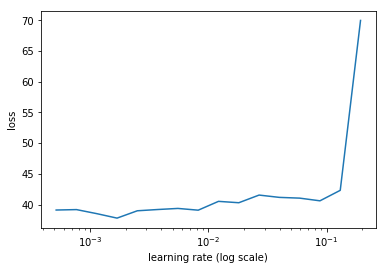

In [91]:
m=NN_Learner(tz_meta,snp_list[4]['tz_a'],tz_plink,pca=False)

In [1]:
cat_vars = ['gender','nationality']

md = ColumnarModelData.from_data_frame(PATH, val_idx, X, y.astype(np.float32), cat_flds=cat_vars, bs=128)
cat_sz = [('gender':3,'nationality':2)]
print(cat_sz)
emb_szs = [(c, min(50, (c+1)//2)) for _,c in cat_sz]
print(emb_szs)

y_range = (130,210)

m = md.get_learner(emb_szs, len(X.columns)-len(cat_vars),
                   0, 1, [128,64,16], [0,0.1,0.1])
lr = 1e-3
m.lr_find()
m.sched.plot()
m.fit(lr, 3, cycle_len=3)

NameError: name 'X' is not defined

In [198]:
#m = md.get_learner(emb_szs, len(X.columns)-len(cat_vars),
#                   0, 1, [256,128,64], [0.3,0.5,0.3], y_range=y_range)

In [213]:
m = md.get_learner(emb_szs, len(X.columns)-len(cat_vars),
                   0, 1, [128,64,16], [0,0.1,0.1])

lr = 1e-3
m.lr_find()
m.sched.plot()
m.fit(lr, 3, cycle_len=3)

In [230]:
m.fit(lr, 10, cycle_len=1)

epoch      trn_loss   val_loss                            
    0      56.733091  62.744966 
    1      49.164127  62.002885                            
    2      44.179577  61.256397                          
    3      42.012801  60.872404                            
    4      39.967664  60.322566                          
    5      43.533669  60.629964                            
    6      42.154946  58.021469                          
    7      41.29138   57.008608                          
    8      40.034128  56.676835                          
    9      40.916238  60.169139                            



[array([60.16914])]

In [983]:
m.save('nn_model1') #R2=0.355

 24%|██▍       | 12/50 [00:00<00:00, 119.82it/s, loss=43.2]

epoch      trn_loss   val_loss                             
    0      80.888028  151.194055



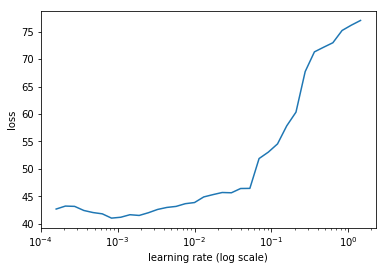

In [984]:
m.lr_find()
m.sched.plot()

In [985]:
m.fit(0.01, 3, cycle_len=1)

epoch      trn_loss   val_loss                             
    0      50.995664  42.544632 
    1      43.480691  41.338056                            
    2      42.126355  41.464497                            



[array([41.4645])]

In [1026]:
m.fit(lr, 10, cycle_len=1)

epoch      trn_loss   val_loss                            
    0      57.78584   49.578513 
    1      53.775634  46.085355                            
    2      51.614049  43.825487                            
    3      50.302809  40.732563                            
    4      49.565065  43.737697                           
    5      47.954103  40.983987                            
    6      47.264173  38.763312                          
    7      46.305101  38.572067                            
    8      45.49319   38.968085                            
    9      46.022123  39.092998                            



[array([39.093])]

In [987]:
m.save('nn_model2') #R2=0.436

In [9]:
m.load('nn_model2')

NameError: name 'm' is not defined

In [231]:
# Predict the heights for the test set
heights = m.predict(True)
heights=heights.reshape(137)
heights = heights.tolist()
challenge = crowdai.Challenge("OpenSNPChallenge2017", "02f5a9824254b85a068fbdfbb1298b8e")
challenge.submit(heights)
challenge.disconnect()

CrowdAI.Event.Authentication : Authenticating for challenge = OpenSNPChallenge2017
CrowdAI.Event.Connection.CONNECTED


  0% |          |[00:00<?]  ?% /s] 

CrowdAI.Event.Authentication.SUCCESS : Authentication Successful


  0% |          |[00:00<?]  ?% /s] 

CrowdAI.Event.Job.ENQUEUED : adf40834-afd7-4b4d-bb1d-a0116c14b777


  0% |          |[00:00<?]  ?% /s] 

CrowdAI.Event.Job.RUNNING : adf40834-afd7-4b4d-bb1d-a0116c14b777


100% |██████████|[00:00<00:00]  109.49% /s] 


CrowdAI.Event.Job.INFO : (adf40834-afd7-4b4d-bb1d-a0116c14b777) Scores Submitted Successfully ! Coefficient of Determination(R^2) : 0.073840333075 ; MSE : 94.1487447856
CrowdAI.Event.Job.COMPLETE : adf40834-afd7-4b4d-bb1d-a0116c14b777	   🍺 


## NN2

In [972]:
def inv_y(a): return np.exp(a)

def exp_rmspe(y_pred, targ):
    targ = inv_y(targ)
    pct_var = (targ - inv_y(y_pred))/targ
    return math.sqrt((pct_var**2).mean())

max_log_y = np.max(y)
y_range = (140,200)

In [317]:
maf=pd.read_csv('../predict_height/lib/maf.csv',index_col=0)

In [321]:
sum([x in maf.index for x in all_bim.snp])

628

In [792]:
# Instantiate a linear model
x_train=X
y_train=y
x_test=df_test
regr = linear_model.LinearRegression()
regr.fit(x_train, y_train)

# Predict the heights for the test set
heights = regr.predict(x_test)

In [793]:
#Convert heights from np.array to a list (to ensure it is JSON serializable)
challenge = crowdai.Challenge("OpenSNPChallenge2017", "02f5a9824254b85a068fbdfbb1298b8e")

heights = heights.tolist()
challenge.submit(heights)
challenge.disconnect()

CrowdAI.Event.Authentication : Authenticating for challenge = OpenSNPChallenge2017
CrowdAI.Event.Connection.CONNECTED



  0% |          |[00:00<?]  ?% /s] 

CrowdAI.Event.Authentication.SUCCESS : Authentication Successful



          
  0% |          |[16:49<?]  ?% /s] 

CrowdAI.Event.Job.ENQUEUED : bc1ef311-9598-4a6c-a9a2-cce75662d779



          
  0% |          |[16:49<?]  ?% /s] 

CrowdAI.Event.Job.RUNNING : bc1ef311-9598-4a6c-a9a2-cce75662d779



          
  0% |          |[16:49<?]  ?% /s] 
100% |██████████|[00:00<00:00]  102.69% /s] 
          
  0% |          |[16:49<?]  ?% /s] .69% /s] 


CrowdAI.Event.Job.INFO : (bc1ef311-9598-4a6c-a9a2-cce75662d779) Scores Submitted Successfully ! Coefficient of Determination(R^2) : -0.0365818509984 ; MSE : 105.373709981
CrowdAI.Event.Job.COMPLETE : bc1ef311-9598-4a6c-a9a2-cce75662d779	   🍺 


In [ ]:
import preprocess
import argparse
import models


def init_args():
    parser = argparse.ArgumentParser(description='Train and save models')
    parser.add_argument('train_datesets', help='Input csv file for training output from parse_inputs.py')
    parser.add_argument('-m', '--model', help='Train model, comma to separate', default='gbr')
    parser.add_argument('-d', '--model-dir', help='Model directory', default='models')
    parser.add_argument('-l', '--list-models', help='List available models', action='store_true')
    args = parser.parse_args()
    return args


def main():
    args = init_args()
    if args.list_models:
        print('\n'.join(models.get_model_names()))
        exit()
    m = args.model.split(',')
    dict_m = models.get_models(m)
    x, y = preprocess.load_data(args.train_datesets)
    for model_name in dict_m:
        model = dict_m[model_name]
        print('Training model %s' % model_name)
        model.fit(x, y)
        models.save_model(model, model_name, args.model_dir)
        print('Train finished, save to %s' % args.model_dir)

